### 1) EDA and Data Preparation:
#### - Number of images as bar plots: Data 1 (Damaged, Not Damaged), Data 2 (Front, Rear, Side), Data 3 (Minor, Moderate, Severe)
#### - Original Data with No Augmentation - New directory created
#### - Original Data + Augmentation 1 - New directory created
#### - Original Data + Augmentation 2 - New directory created

In [3]:
# %conda install conda-forge::tensorflow
# %pip install tensorflow
# %conda install pydot
# %conda install graphviz

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re
import random
from tqdm import tqdm
import cv2
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing import image
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import img_to_array

2024-07-08 18:45:50.160267: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [5]:
os.getcwd()

'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP'

In [6]:
def plot_bar(class_labels,counts,name):
    plt.figure(figsize = (5,5))
    f = sns.barplot(x = classes, y = counts)
    plt.xlabel("Class labels", fontsize=12)
    plt.ylabel('Count', fontsize=12)
    plt.title("Number of Images in "+name+' folder', fontsize=15)
    plt.show()

def img_shapes(files,path):
    shapes = []
    for i in files:
        img = cv2.imread(path+'/'+i)
        shapes.append(img.shape)
    return shapes

#### Data 1A (Damaged & Undamaged)

In [8]:
train_damaged_list = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage')
train_not_damaged_list = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/01-whole')
test_damaged_list = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/00-damage')
test_not_damaged_list = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/01-whole')

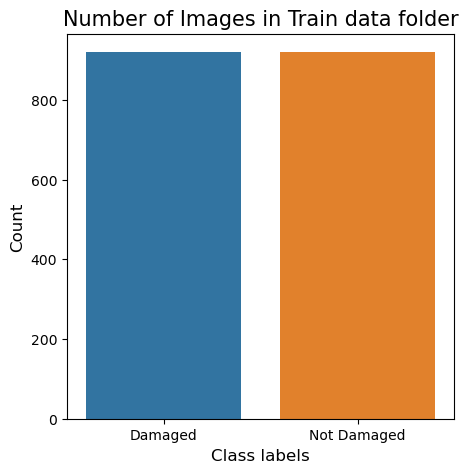

Number of Damaged images in train is 920
Number of Not Damaged images in train is 920


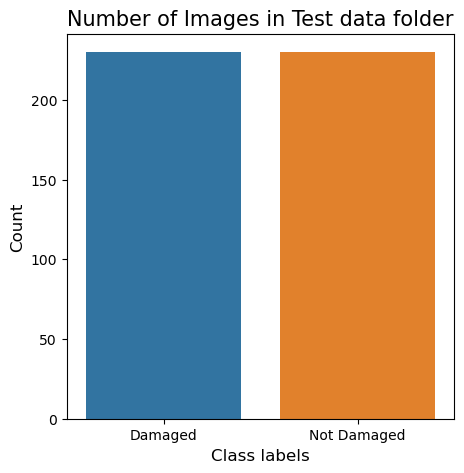

Number of Damaged images in test is 230
Number of Not Damaged images in test is 230


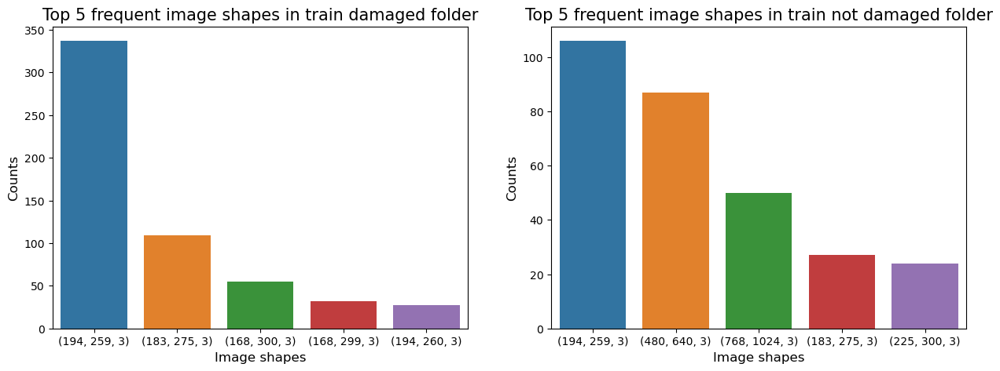

No of unique image shapes in train damaged are  132
No of unique image shapes in train not damaged are  385


In [9]:
classes = ['Damaged','Not Damaged']
counts = [len(train_damaged_list),len(train_not_damaged_list)]
plot_bar(classes,counts,'Train data')
for i in range(len(classes)):
    print('Number of '+classes[i]+' images in train is '+str(counts[i]))
    
classes = ['Damaged','Not Damaged']
counts = [len(test_damaged_list),len(test_not_damaged_list)]
plot_bar(classes,counts,'Test data')
for i in range(len(classes)):
    print('Number of '+classes[i]+' images in test is '+str(counts[i]))

train_dmg = img_shapes(train_damaged_list,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage')
train_no_dmg = img_shapes(train_not_damaged_list,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/01-whole')
train_df = pd.DataFrame(list(zip(train_dmg,train_no_dmg)),columns = classes)

#Damaged train
num = [str(i) for i in train_df['Damaged'].value_counts().index[:5]]
counts_val = [i for i in train_df['Damaged'].value_counts()[:5]]
plt.figure(figsize = (15,5))
plt.subplot(1,2,1)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 frequent image shapes in train damaged folder", fontsize=15)

#Not Damaged train
num = [str(i) for i in train_df['Not Damaged'].value_counts().index[:5]]
counts_val = [i for i in train_df['Not Damaged'].value_counts()[:5]]
plt.subplot(1,2,2)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 frequent image shapes in train not damaged folder", fontsize=15)
plt.show()


print('No of unique image shapes in train damaged are ',len(train_df['Damaged'].unique()))
print('No of unique image shapes in train not damaged are ',len(train_df['Not Damaged'].unique()))

#### Data 2A (Front & Rear & Side)

In [11]:
train_front = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/00-front')
train_rear = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/01-rear')
train_side = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/02-side')
test_front = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/00-front')
test_rear = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/01-rear')
test_side = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/02-side')

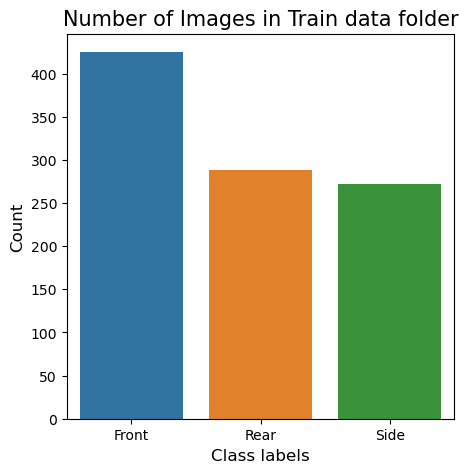

Number of Front images in train is 425
Number of Rear images in train is 288
Number of Side images in train is 272


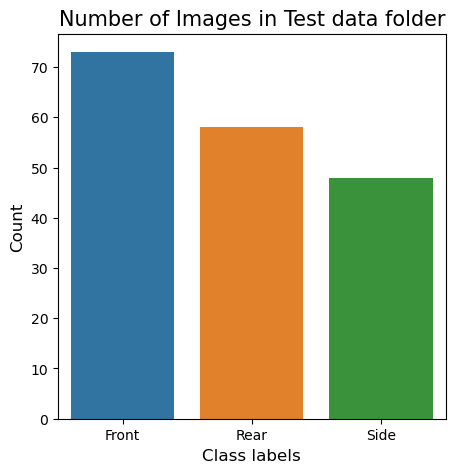

Number of Front images in test is 73
Number of Rear images in test is 58
Number of Side images in test is 48


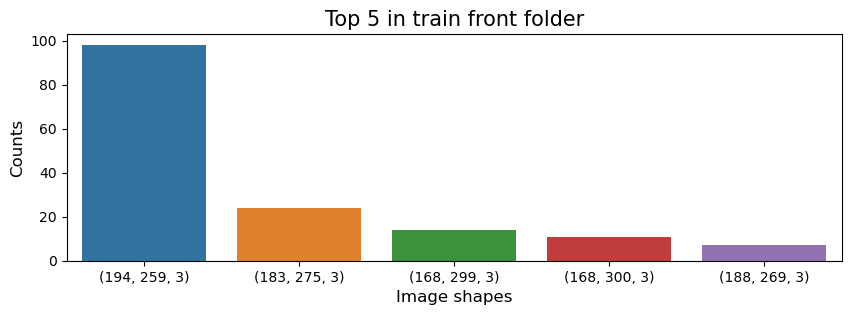

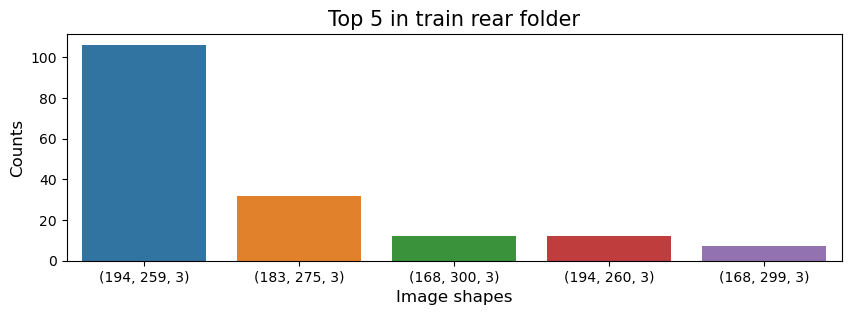

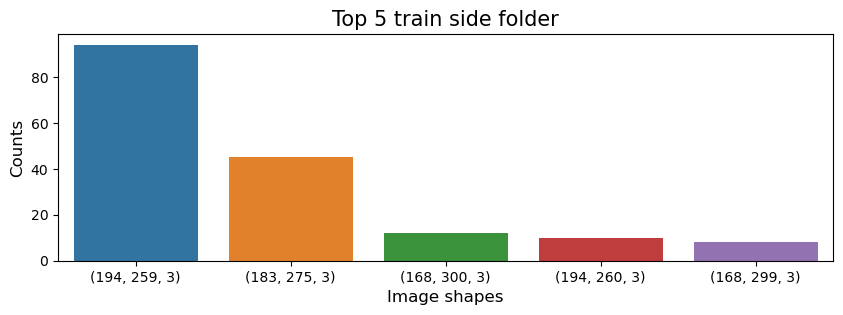

No of unique image shapes in train front are  69
No of unique image shapes in train rear are  67
No of unique image shapes in train side are  60


In [12]:
classes = ['Front','Rear','Side']
counts = [len(train_front),len(train_rear),len(train_side)]
plot_bar(classes,counts,'Train data')
for i in range(len(classes)):
    print('Number of '+classes[i]+' images in train is '+str(counts[i]))

classes = ['Front','Rear','Side']
counts = [len(test_front),len(test_rear),len(test_side)]
plot_bar(classes,counts,'Test data')
for i in range(len(classes)):
    print('Number of '+classes[i]+' images in test is '+str(counts[i]))

train_front_shape = img_shapes(train_front,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/00-front')
train_rear_shape = img_shapes(train_rear,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/01-rear')
train_side_shape = img_shapes(train_side,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/02-side')
train_df = pd.DataFrame(list(zip(train_front_shape,train_rear_shape,train_side_shape)),columns = classes)

#Front train
num = [str(i) for i in train_df['Front'].value_counts().index[:5]]
counts_val = [i for i in train_df['Front'].value_counts()[:5]]
plt.figure(figsize = (10,10))
plt.subplot(3,1,1)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 in train front folder", fontsize=15)

#Rear train
plt.figure(figsize = (10,10))
num = [str(i) for i in train_df['Rear'].value_counts().index[:5]]
counts_val = [i for i in train_df['Rear'].value_counts()[:5]]
plt.subplot(3,1,2)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 in train rear folder", fontsize=15)
plt.show()

#Side train
plt.figure(figsize = (10,10))
num = [str(i) for i in train_df['Side'].value_counts().index[:5]]
counts_val = [i for i in train_df['Side'].value_counts()[:5]]
plt.subplot(3,1,3)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 train side folder", fontsize=15)
plt.show()


print('No of unique image shapes in train front are ',len(train_df['Front'].unique()))
print('No of unique image shapes in train rear are ',len(train_df['Rear'].unique()))
print('No of unique image shapes in train side are ',len(train_df['Side'].unique()))

#### Data 3A (Minor & Moderate & Severe)

In [14]:
train_minor = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/01-minor')
train_moderate = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/02-moderate')
train_severe = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/03-severe')
test_minor = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/01-minor')
test_moderate = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/02-moderate')
test_severe = os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/03-severe')

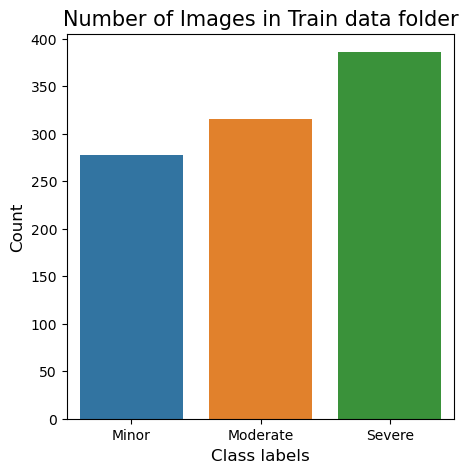

Number of Minor images in train is 278
Number of Moderate images in train is 315
Number of Severe images in train is 386


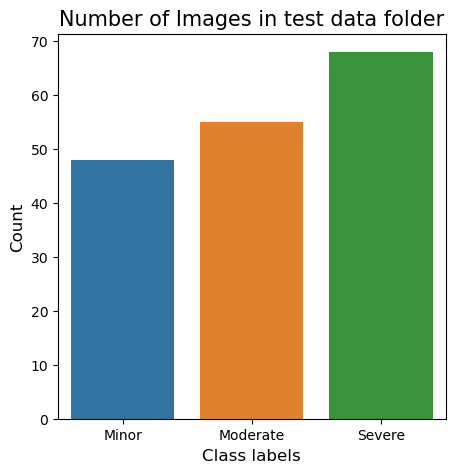

Number of Minor images in test is 48
Number of Moderate images in test is 55
Number of Severe images in test is 68


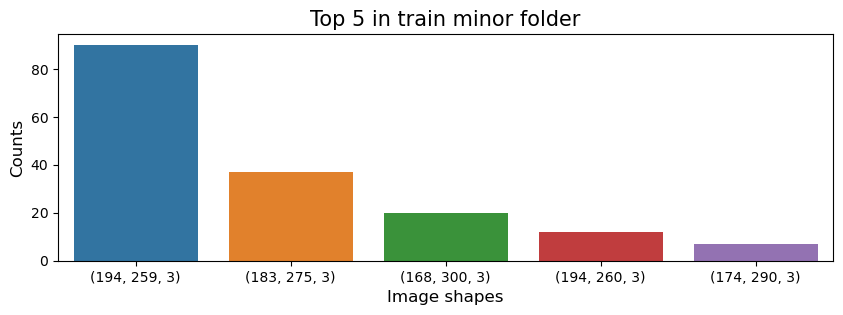

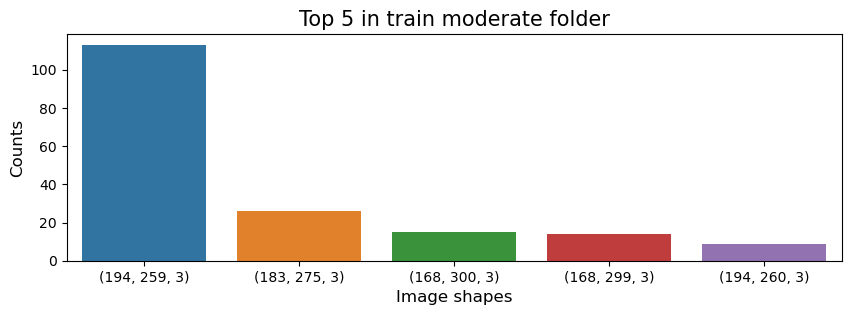

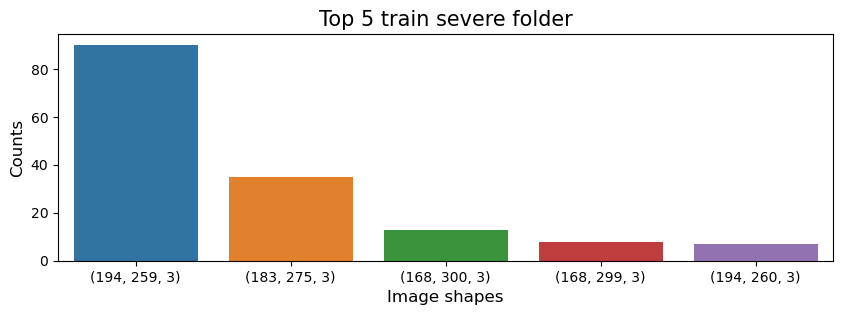

No of unique image shapes in train minor are  66
No of unique image shapes in train moderate are  62
No of unique image shapes in train severe are  68


In [15]:
classes = ['Minor','Moderate','Severe']
counts = [len(train_minor),len(train_moderate),len(train_severe)]
plot_bar(classes,counts,'Train data')
for i in range(len(classes)):
    print('Number of '+classes[i]+' images in train is '+str(counts[i]))

classes = ['Minor','Moderate','Severe']
counts = [len(test_minor),len(test_moderate),len(test_severe)]
plot_bar(classes,counts,'test data')
for i in range(len(classes)):
    print('Number of '+classes[i]+' images in test is '+str(counts[i]))

train_minor_shape = img_shapes(train_minor,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/01-minor')
train_moderate_shape = img_shapes(train_moderate,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/02-moderate')
train_severe_shape = img_shapes(train_severe,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/03-severe')
train_df = pd.DataFrame(list(zip(train_minor_shape,train_moderate_shape,train_severe_shape)),columns = classes)

#Front train
num = [str(i) for i in train_df['Minor'].value_counts().index[:5]]
counts_val = [i for i in train_df['Minor'].value_counts()[:5]]
plt.figure(figsize = (10,10))
plt.subplot(3,1,1)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 in train minor folder", fontsize=15)

#Rear train
plt.figure(figsize = (10,10))
num = [str(i) for i in train_df['Moderate'].value_counts().index[:5]]
counts_val = [i for i in train_df['Moderate'].value_counts()[:5]]
plt.subplot(3,1,2)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 in train moderate folder", fontsize=15)
plt.show()

#Side train
plt.figure(figsize = (10,10))
num = [str(i) for i in train_df['Severe'].value_counts().index[:5]]
counts_val = [i for i in train_df['Severe'].value_counts()[:5]]
plt.subplot(3,1,3)
sns.barplot(x = num,y =counts_val)
plt.xlabel("Image shapes", fontsize=12)
plt.ylabel('Counts', fontsize=12)
plt.title("Top 5 train severe folder", fontsize=15)
plt.show()


print('No of unique image shapes in train minor are ',len(train_df['Minor'].unique()))
print('No of unique image shapes in train moderate are ',len(train_df['Moderate'].unique()))
print('No of unique image shapes in train severe are ',len(train_df['Severe'].unique()))

###

### Data without Augmentation

In [18]:
lists = [['damaged','not_damaged'],['front','rear','side'],['minor','moderate','severe']]
data = ['data_1','data_2','data_3']

paths = []
def create_folders(name,class_lists,data):
    os.mkdir(name)
    for i in range(3):
        os.mkdir(name+'/'+data[i])
        for j in ['train','test']:
            temp_paths = []
            os.mkdir(name+'/'+data[i]+'/'+j)
            for k in class_lists[i]:
                os.mkdir(name+'/'+data[i]+'/'+j+'/'+k)
                temp_paths.append(name+'/'+data[i]+'/'+j+'/'+k)
            paths.append(temp_paths)
create_folders('data',lists,data)

def save_images(name,save_path,image_path):
    #Reading the image from given path.
    image_org = image.load_img(image_path+'/'+name)
    #Saving original image to folder.
    image_org.save(save_path+'/'+name)

#### Data - 1

In [20]:
train_save_path_1 = paths[0][0]
train_save_path_2 = paths[0][1]
test_save_path_1 = paths[1][0]
test_save_path_2 = paths[1][1]
print(train_save_path_1)
print(train_save_path_2)
print(test_save_path_1)
print(test_save_path_2)

data/data_1/train/damaged
data/data_1/train/not_damaged
data/data_1/test/damaged
data/data_1/test/not_damaged


In [21]:
for i in tqdm(train_damaged_list):
    save_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage')
for i in tqdm(train_not_damaged_list):
    save_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/01-whole')
for i in tqdm(test_damaged_list):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/00-damage')
for i in tqdm(test_not_damaged_list):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/01-whole')

100%|█████████████████████████████████████████| 230/230 [00:02<00:00, 93.30it/s]


#### Data - 2

In [23]:
train_save_path_1 = paths[2][0]
train_save_path_2 = paths[2][1]
train_save_path_3 = paths[2][2]
test_save_path_1 = paths[3][0]
test_save_path_2 = paths[3][1]
test_save_path_3 = paths[3][2]
print(train_save_path_1)
print(train_save_path_2)
print(train_save_path_3)
print(test_save_path_1)
print(test_save_path_2)
print(test_save_path_3)

data/data_2/train/front
data/data_2/train/rear
data/data_2/train/side
data/data_2/test/front
data/data_2/test/rear
data/data_2/test/side


In [24]:
for i in tqdm(train_front):
    save_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/00-front')
for i in tqdm(train_rear):
    save_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/01-rear')
for i in tqdm(train_side):
    save_images(i,train_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/02-side')
for i in tqdm(test_front):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/00-front')
for i in tqdm(test_rear):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/01-rear')
for i in tqdm(test_side):
    save_images(i,test_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/02-side')

100%|██████████████████████████████████████████| 48/48 [00:00<00:00, 617.01it/s]


#### Data - 3

In [26]:
train_save_path_1 = paths[4][0]
train_save_path_2 = paths[4][1]
train_save_path_3 = paths[4][2]
test_save_path_1 = paths[5][0]
test_save_path_2 = paths[5][1]
test_save_path_3 = paths[5][2]
print(train_save_path_1)
print(train_save_path_2)
print(train_save_path_3)
print(test_save_path_1)
print(test_save_path_2)
print(test_save_path_3)

data/data_3/train/minor
data/data_3/train/moderate
data/data_3/train/severe
data/data_3/test/minor
data/data_3/test/moderate
data/data_3/test/severe


In [27]:
for i in tqdm(train_minor):
    save_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/01-minor')
for i in tqdm(train_moderate):
    save_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/02-moderate')
for i in tqdm(train_severe):
    save_images(i,train_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/03-severe')
for i in tqdm(test_minor):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/01-minor')
for i in tqdm(test_moderate):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/02-moderate')
for i in tqdm(test_severe):
    save_images(i,test_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/03-severe')

100%|██████████████████████████████████████████| 68/68 [00:00<00:00, 581.04it/s]


###

### Data Augmentation 1 (-20 and 20 degrees random rotation and horizontal flip transformations)

In [30]:
lists = [['damaged','not_damaged'],['front','rear','side'],['minor','moderate','severe']]
data = ['data_1','data_2','data_3']

paths = []
def create_folders(name,class_lists,data):
    os.mkdir(name)
    for i in range(3):
        os.mkdir(name+'/'+data[i])
        for j in ['train','test']:
            temp_paths = []
            os.mkdir(name+'/'+data[i]+'/'+j)
            for k in class_lists[i]:
                os.mkdir(name+'/'+data[i]+'/'+j+'/'+k)
                temp_paths.append(name+'/'+data[i]+'/'+j+'/'+k)
            paths.append(temp_paths)
create_folders('data_augmentation_1',lists,data)

In [31]:
#Creating a function to create images
def create_images(name,save_path,image_path):
    #Generating a random number for rotation
    rotation = random.randint(-20,20)
    #Creating Image Data Generator:
    augmentation = ImageDataGenerator(rotation_range=rotation,horizontal_flip=True)
    
    #Reading the image from given path.
    image_org = image.load_img(image_path+'/'+name)
    
    #Saving original image to folder.
    image_org.save(save_path+'/'+name)
    
    #Getting the numpy array of image.
    image_arr = image.img_to_array(image_org)
    
    #Expanding dimensions of image array
    image_arr = image_arr.reshape((1,) + image_arr.shape)
    
    #Using Flow to generate 2 new images for single image
    for arr,val in zip(augmentation.flow(image_arr, batch_size=1, save_format='jpeg'),range(1)):
        name = name.split('.')[0]
        img_save = image.array_to_img(arr[0], scale=False)
        img_save.save(save_path+'/'+name+'_aug_'+str(val)+'.jpeg')
    return paths

In [32]:
#Saving images
def save_images(name,save_path,image_path):
    
    #Reading the image from given path.
    image_org = image.load_img(image_path+'/'+name)
    
    #Saving original image to folder.
    image_org.save(save_path+'/'+name)

#### 

#### Data - 1

##### Visualization (example)

In [36]:
#Getting a sample file name from list of file names
sample_file = random.choice(train_damaged_list)
#Getting a random rotation between -20 and 20
rotation = random.randint(-20,20)
augmentation = ImageDataGenerator(rotation_range=rotation,horizontal_flip=True)
sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage'+'/'+sample_file)
sample_img_array = image.img_to_array(sample_img)
sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
samples = []
for arr,val in zip(augmentation.flow(sample_img_array, batch_size=1, save_format='jpg'),range(1)):
    img_save = image.array_to_img(arr[0], scale=False)
    samples.append(img_save)

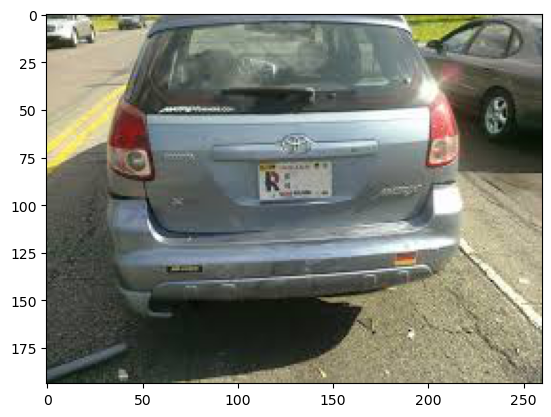

In [37]:
plt.imshow(sample_img)

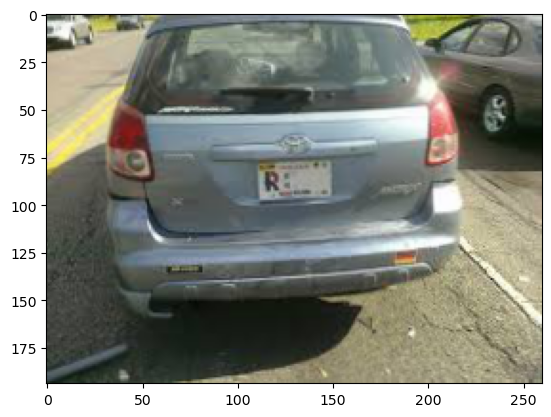

In [38]:
plt.imshow(samples[0])

##### Saving original and augmented images (2 x train) (== test) in folders created

In [40]:
train_save_path_1 = paths[0][0]
train_save_path_2 = paths[0][1]
test_save_path_1 = paths[1][0]
test_save_path_2 = paths[1][1]
print(train_save_path_1)
print(train_save_path_2)
print(test_save_path_1)
print(test_save_path_2)

data_augmentation_1/data_1/train/damaged
data_augmentation_1/data_1/train/not_damaged
data_augmentation_1/data_1/test/damaged
data_augmentation_1/data_1/test/not_damaged


In [41]:
for i in tqdm(train_damaged_list):
    create_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage')
for i in tqdm(train_not_damaged_list):
    create_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/01-whole')
for i in tqdm(test_damaged_list):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/00-damage')
for i in tqdm(test_not_damaged_list):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/01-whole')

100%|█████████████████████████████████████████| 230/230 [00:02<00:00, 89.79it/s]


####

#### Data - 2

##### Visualization (example)

In [45]:
#Getting a sample file name from list of file names
sample_file = random.choice(train_front)
#Getting a random rotation between -20 and 20
rotation = random.randint(-20,20)
augmentation = ImageDataGenerator(rotation_range=rotation,horizontal_flip=True)
sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/00-front'+'/'+sample_file)
sample_img_array = image.img_to_array(sample_img)
sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
samples = []
for arr,val in zip(augmentation.flow(sample_img_array, batch_size=1, save_format='jpg'),range(1)):
    img_save = image.array_to_img(arr[0], scale=False) #scale=False did the trick
    samples.append(img_save)

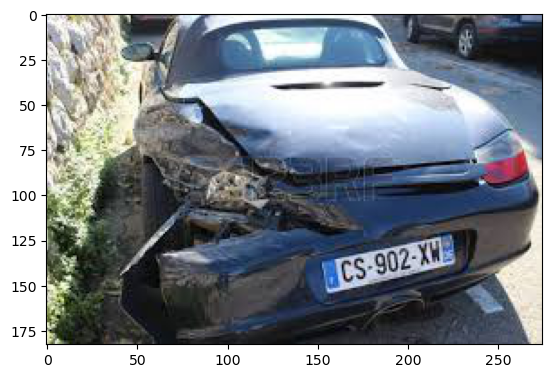

In [46]:
plt.imshow(sample_img)

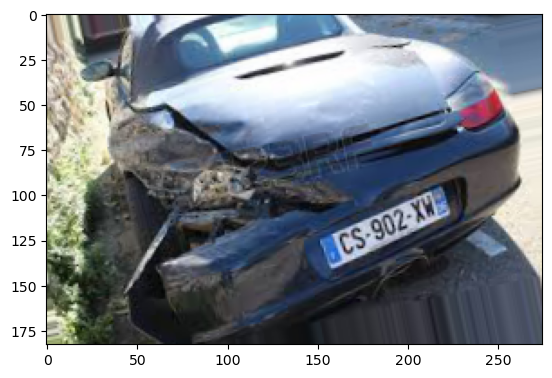

In [47]:
plt.imshow(samples[0])

##### Saving original and augmented images (2 x train) (== test) in folders created

In [49]:
train_save_path_1 = paths[2][0]
train_save_path_2 = paths[2][1]
train_save_path_3 = paths[2][2]
test_save_path_1 = paths[3][0]
test_save_path_2 = paths[3][1]
test_save_path_3 = paths[3][2]
print(train_save_path_1)
print(train_save_path_2)
print(train_save_path_3)
print(test_save_path_1)
print(test_save_path_2)
print(test_save_path_3)

data_augmentation_1/data_2/train/front
data_augmentation_1/data_2/train/rear
data_augmentation_1/data_2/train/side
data_augmentation_1/data_2/test/front
data_augmentation_1/data_2/test/rear
data_augmentation_1/data_2/test/side


In [50]:
for i in tqdm(train_front):
    create_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/00-front')
for i in tqdm(train_rear):
    create_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/01-rear')
for i in tqdm(train_side):
    create_images(i,train_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/02-side')
for i in tqdm(test_front):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/00-front')
for i in tqdm(test_rear):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/01-rear')
for i in tqdm(test_side):
    save_images(i,test_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/02-side')

100%|██████████████████████████████████████████| 48/48 [00:00<00:00, 600.34it/s]


####

#### Data - 3

##### Visualization (example)

In [54]:
#Getting a sample file name from list of file names
sample_file = random.choice(train_moderate)
#Getting a random rotation between -20 and 20
rotation = random.randint(-20,20)
augmentation = ImageDataGenerator(rotation_range=rotation,horizontal_flip=True)
sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/02-moderate'+'/'+sample_file)
sample_img_array = image.img_to_array(sample_img)
sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
samples = []
for arr,val in zip(augmentation.flow(sample_img_array, batch_size=1, save_format='jpg'),range(1)):
    img_save = image.array_to_img(arr[0], scale=False)
    samples.append(img_save)

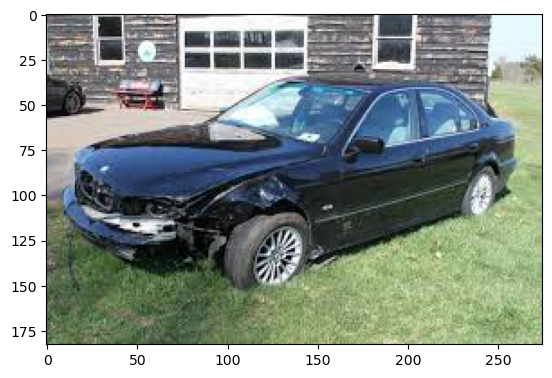

In [55]:
plt.imshow(sample_img)

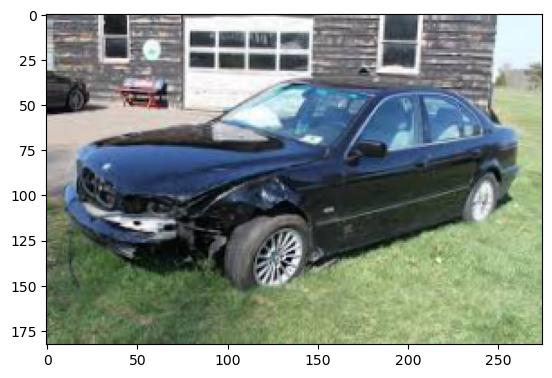

In [56]:
plt.imshow(samples[0])

##### Saving original and augmented images (2 x train) (== test) in folders created

In [58]:
train_save_path_1 = paths[4][0]
train_save_path_2 = paths[4][1]
train_save_path_3 = paths[4][2]
test_save_path_1 = paths[5][0]
test_save_path_2 = paths[5][1]
test_save_path_3 = paths[5][2]
print(train_save_path_1)
print(train_save_path_2)
print(train_save_path_3)
print(test_save_path_1)
print(test_save_path_2)
print(test_save_path_3)

data_augmentation_1/data_3/train/minor
data_augmentation_1/data_3/train/moderate
data_augmentation_1/data_3/train/severe
data_augmentation_1/data_3/test/minor
data_augmentation_1/data_3/test/moderate
data_augmentation_1/data_3/test/severe


In [59]:
for i in tqdm(train_minor):
    create_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/01-minor')
for i in tqdm(train_moderate):
    create_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/02-moderate')
for i in tqdm(train_severe):
    create_images(i,train_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/03-severe')
for i in tqdm(test_minor):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/01-minor')
for i in tqdm(test_moderate):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/02-moderate')
for i in tqdm(test_severe):
    save_images(i,test_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/03-severe')

100%|██████████████████████████████████████████| 68/68 [00:00<00:00, 567.63it/s]


#####

### Updated file counts (train & test) after Augmentation 1

In [62]:
data_1_train_files = len(os.listdir('data_augmentation_1/data_1/train/damaged')) + len(os.listdir('data_augmentation_1/data_1/train/not_damaged'))
print(data_1_train_files, '- Number of train files (DATA 1) for all classes damaged and not damaged')

3680 - Number of train files (DATA 1) for all classes damaged and not damaged


In [63]:
data_2_train_files = len(os.listdir('data_augmentation_1/data_2/train/front')) + len(os.listdir('data_augmentation_1/data_2/train/rear')) + len(os.listdir('data_augmentation_1/data_2/train/side'))
print(data_2_train_files, '- Number of train files (DATA 2) for all classes front, rear and side')

1970 - Number of train files (DATA 2) for all classes front, rear and side


In [64]:
data_3_train_files = len(os.listdir('data_augmentation_1/data_3/train/minor')) + len(os.listdir('data_augmentation_1/data_3/train/moderate')) + len(os.listdir('data_augmentation_1/data_3/train/severe'))
print(data_3_train_files, '- Number of train files (DATA 3) for all classes minor, moderate and severe')

1958 - Number of train files (DATA 3) for all classes minor, moderate and severe


In [65]:
data_1_test_files = len(os.listdir('data_augmentation_1/data_1/test/damaged')) + len(os.listdir('data_augmentation_1/data_1/test/not_damaged'))
print(data_1_test_files, '- Number of test files (DATA 1) for all classes damaged and not damaged')

460 - Number of test files (DATA 1) for all classes damaged and not damaged


In [66]:
data_2_test_files = len(os.listdir('data_augmentation_1/data_2/test/front')) + len(os.listdir('data_augmentation_1/data_2/test/rear')) + len(os.listdir('data_augmentation_1/data_2/test/side'))
print(data_2_test_files, '- Number of test files (DATA 2) for all classes front, rear and side')

179 - Number of test files (DATA 2) for all classes front, rear and side


In [67]:
data_3_test_files = len(os.listdir('data_augmentation_1/data_3/test/minor')) + len(os.listdir('data_augmentation_1/data_3/test/moderate')) + len(os.listdir('data_augmentation_1/data_3/test/severe'))
print(data_3_test_files, '- Number of test files (DATA 3) for all classes minor, moderate and severe')

171 - Number of test files (DATA 3) for all classes minor, moderate and severe


###

### Data Augmentation 2 (-20 & 20 degrees random rotation, shear range of 0.2, zoom range of 0.2 and horizontal flips)

In [70]:
lists = [['damaged','not_damaged'],['front','rear','side'],['minor','moderate','severe']]
data = ['data_1','data_2','data_3']

paths = []
def create_folders(name,class_lists,data):
    os.mkdir(name)
    for i in range(3):
        os.mkdir(name+'/'+data[i])
        for j in ['train','test']:
            temp_paths = []
            os.mkdir(name+'/'+data[i]+'/'+j)
            for k in class_lists[i]:
                os.mkdir(name+'/'+data[i]+'/'+j+'/'+k)
                temp_paths.append(name+'/'+data[i]+'/'+j+'/'+k)
            paths.append(temp_paths)
create_folders('data_augmentation_2',lists,data)

In [71]:
#Creating a function to create images
def create_images(name,save_path,image_path):
    #Generating a random number for rotation
    rotation = random.randint(-20,20)
    #Creating Image Data Generator:
    augmentation = ImageDataGenerator(rotation_range=rotation, shear_range = 0.2, zoom_range = 0.2, horizontal_flip=True)
    
    #Reading the image from given path.
    image_org = image.load_img(image_path+'/'+name)
    
    #Saving original image to folder.
    image_org.save(save_path+'/'+name)
    
    #Getting the numpy array of image.
    image_arr = image.img_to_array(image_org)
    
    #Expanding dimensions of image array
    image_arr = image_arr.reshape((1,) + image_arr.shape)
    
    #Using Flow to generate 4 new images for single image
    for arr,val in zip(augmentation.flow(image_arr, batch_size=1, save_format='jpeg'),range(1)):
        name = name.split('.')[0]
        img_save = image.array_to_img(arr[0], scale=False)
        img_save.save(save_path+'/'+name+'_aug_'+str(val)+'.jpeg')
    return paths

In [72]:
#Saving images
def save_images(name,save_path,image_path):
    
    #Reading the image from given path.
    image_org = image.load_img(image_path+'/'+name)
    
    #Saving original image to folder.
    image_org.save(save_path+'/'+name)

####

#### Data - 1

##### Visualization (example)

In [76]:
#Getting a sample file name from list of file names
sample_file = random.choice(train_damaged_list)
#Getting a random rotation between -20 and 20
rotation = random.randint(-20,20)
augmentation = ImageDataGenerator(rotation_range=rotation, shear_range = 0.2, zoom_range = 0.2, horizontal_flip=True)
sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage'+'/'+sample_file)
sample_img_array = image.img_to_array(sample_img)
sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
samples = []
for arr,val in zip(augmentation.flow(sample_img_array, batch_size=1, save_format='jpg'),range(1)):
    img_save = image.array_to_img(arr[0], scale=False) #scale=False did the trick
    samples.append(img_save)

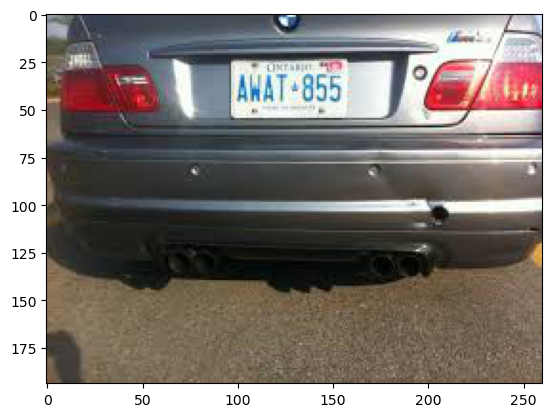

In [77]:
plt.imshow(sample_img)

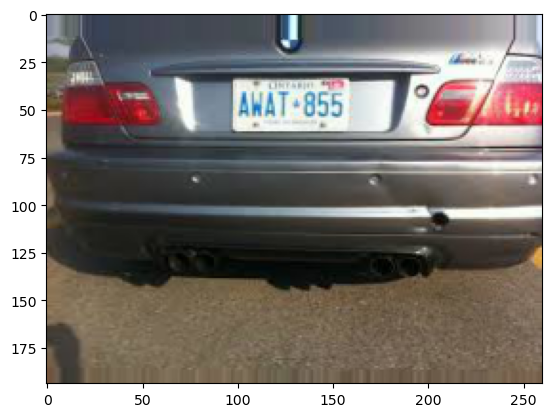

In [78]:
plt.imshow(samples[0])

##### Saving original and augmented images (2 x train) (== test) in folders created

In [80]:
train_save_path_1 = paths[0][0]
train_save_path_2 = paths[0][1]
test_save_path_1 = paths[1][0]
test_save_path_2 = paths[1][1]
print(train_save_path_1)
print(train_save_path_2)
print(test_save_path_1)
print(test_save_path_2)

data_augmentation_2/data_1/train/damaged
data_augmentation_2/data_1/train/not_damaged
data_augmentation_2/data_1/test/damaged
data_augmentation_2/data_1/test/not_damaged


In [81]:
for i in tqdm(train_damaged_list):
    create_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/00-damage')
for i in tqdm(train_not_damaged_list):
    create_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/training/01-whole')
for i in tqdm(test_damaged_list):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/00-damage')
for i in tqdm(test_not_damaged_list):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data1a/validation/01-whole')

100%|█████████████████████████████████████████| 230/230 [00:02<00:00, 94.96it/s]


####

#### Data - 2

##### Visualization (example)

In [85]:
#Getting a sample file name from list of file names
sample_file = random.choice(train_rear)
#Getting a random rotation between -20 and 20
rotation = random.randint(-20,20)
augmentation = ImageDataGenerator(rotation_range=rotation, shear_range = 0.2, zoom_range = 0.2, horizontal_flip=True)
sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/01-rear'+'/'+sample_file)
sample_img_array = image.img_to_array(sample_img)
sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
samples = []
for arr,val in zip(augmentation.flow(sample_img_array, batch_size=1, save_format='jpg'),range(1)):
    img_save = image.array_to_img(arr[0], scale=False) #scale=False did the trick
    samples.append(img_save)

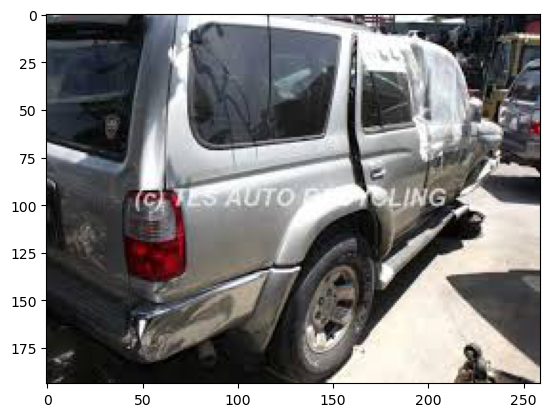

In [86]:
plt.imshow(sample_img)

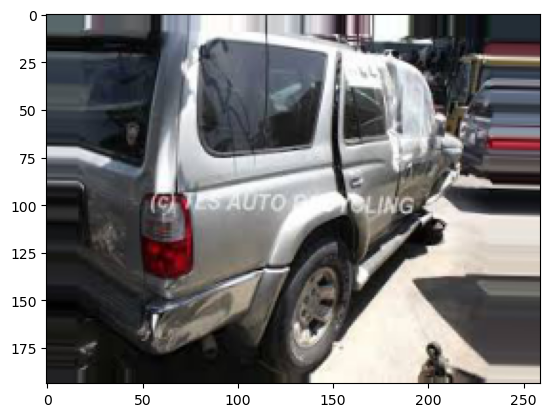

In [87]:
plt.imshow(samples[0])

##### Saving original and augmented images (2 x train) (== test) in folders created

In [89]:
train_save_path_1 = paths[2][0]
train_save_path_2 = paths[2][1]
train_save_path_3 = paths[2][2]
test_save_path_1 = paths[3][0]
test_save_path_2 = paths[3][1]
test_save_path_3 = paths[3][2]
print(train_save_path_1)
print(train_save_path_2)
print(train_save_path_3)
print(test_save_path_1)
print(test_save_path_2)
print(test_save_path_3)

data_augmentation_2/data_2/train/front
data_augmentation_2/data_2/train/rear
data_augmentation_2/data_2/train/side
data_augmentation_2/data_2/test/front
data_augmentation_2/data_2/test/rear
data_augmentation_2/data_2/test/side


In [90]:
for i in tqdm(train_front):
    create_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/00-front')
for i in tqdm(train_rear):
    create_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/01-rear')
for i in tqdm(train_side):
    create_images(i,train_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/training/02-side')
for i in tqdm(test_front):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/00-front')
for i in tqdm(test_rear):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/01-rear')
for i in tqdm(test_side):
    save_images(i,test_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data2a/validation/02-side')

100%|██████████████████████████████████████████| 48/48 [00:00<00:00, 602.23it/s]


####

#### Data - 3

##### Visualization (example)

In [94]:
#Getting a sample file name from list of file names
sample_file = random.choice(train_severe)
#Getting a random rotation between -20 and 20
rotation = random.randint(-20,20)
augmentation = ImageDataGenerator(rotation_range=rotation, shear_range = 0.2, zoom_range = 0.2, horizontal_flip=True)
sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/03-severe'+'/'+sample_file)
sample_img_array = image.img_to_array(sample_img)
sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
samples = []
for arr,val in zip(augmentation.flow(sample_img_array, batch_size=1, save_format='jpg'),range(1)):
    img_save = image.array_to_img(arr[0], scale=False) #scale=False did the trick
    samples.append(img_save)

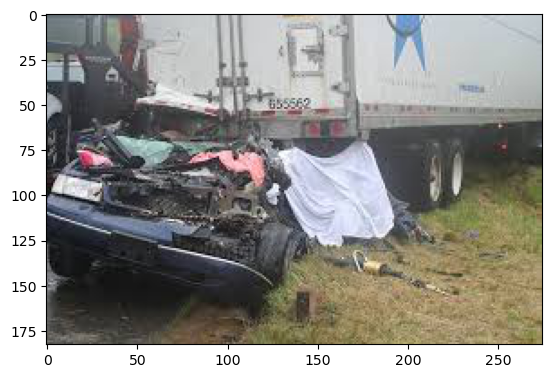

In [95]:
plt.imshow(sample_img)

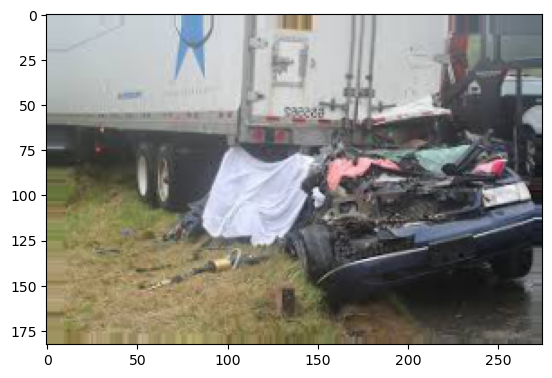

In [96]:
plt.imshow(samples[0])

##### Saving original and augmented images (2 x train) (== test) in folders created

In [98]:
train_save_path_1 = paths[4][0]
train_save_path_2 = paths[4][1]
train_save_path_3 = paths[4][2]
test_save_path_1 = paths[5][0]
test_save_path_2 = paths[5][1]
test_save_path_3 = paths[5][2]
print(train_save_path_1)
print(train_save_path_2)
print(train_save_path_3)
print(test_save_path_1)
print(test_save_path_2)
print(test_save_path_3)

data_augmentation_2/data_3/train/minor
data_augmentation_2/data_3/train/moderate
data_augmentation_2/data_3/train/severe
data_augmentation_2/data_3/test/minor
data_augmentation_2/data_3/test/moderate
data_augmentation_2/data_3/test/severe


In [99]:
for i in tqdm(train_minor):
    create_images(i,train_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/01-minor')
for i in tqdm(train_moderate):
    create_images(i,train_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/02-moderate')
for i in tqdm(train_severe):
    create_images(i,train_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/training/03-severe')
for i in tqdm(test_minor):
    save_images(i,test_save_path_1,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/01-minor')
for i in tqdm(test_moderate):
    save_images(i,test_save_path_2,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/02-moderate')
for i in tqdm(test_severe):
    save_images(i,test_save_path_3,'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data3a/validation/03-severe')

100%|██████████████████████████████████████████| 68/68 [00:00<00:00, 586.40it/s]


#####

### Updated file counts (train & test) after Augmentation 2

In [102]:
data_1_train_files = len(os.listdir('data_augmentation_2/data_1/train/damaged')) + len(os.listdir('data_augmentation_2/data_1/train/not_damaged'))
print(data_1_train_files, '- Number of train files (DATA 1) for all classes damaged and not damaged')

3680 - Number of train files (DATA 1) for all classes damaged and not damaged


In [103]:
data_2_train_files = len(os.listdir('data_augmentation_2/data_2/train/front')) + len(os.listdir('data_augmentation_2/data_2/train/rear')) + len(os.listdir('data_augmentation_2/data_2/train/side'))
print(data_2_train_files, '- Number of train files (DATA 2) for all classes front, rear and side')

1970 - Number of train files (DATA 2) for all classes front, rear and side


In [104]:
data_3_train_files = len(os.listdir('data_augmentation_2/data_3/train/minor')) + len(os.listdir('data_augmentation_2/data_3/train/moderate')) + len(os.listdir('data_augmentation_2/data_3/train/severe'))
print(data_3_train_files, '- Number of train files (DATA 3) for all classes minor, moderate and severe')

1958 - Number of train files (DATA 3) for all classes minor, moderate and severe


In [105]:
data_1_test_files = len(os.listdir('data_augmentation_2/data_1/test/damaged')) + len(os.listdir('data_augmentation_2/data_1/test/not_damaged'))
print(data_1_test_files, '- Number of test files (DATA 1) for all classes damaged and not damaged')

460 - Number of test files (DATA 1) for all classes damaged and not damaged


In [106]:
data_2_test_files = len(os.listdir('data_augmentation_2/data_2/test/front')) + len(os.listdir('data_augmentation_2/data_2/test/rear')) + len(os.listdir('data_augmentation_2/data_2/test/side'))
print(data_2_test_files, '- Number of test files (DATA 2) for all classes front, rear and side')

179 - Number of test files (DATA 2) for all classes front, rear and side


In [107]:
data_3_test_files = len(os.listdir('data_augmentation_2/data_3/test/minor')) + len(os.listdir('data_augmentation_2/data_3/test/moderate')) + len(os.listdir('data_augmentation_2/data_3/test/severe'))
print(data_3_test_files, '- Number of test files (DATA 3) for all classes minor, moderate and severe')

171 - Number of test files (DATA 3) for all classes minor, moderate and severe


### * * * * *

### 

### 

### 

### 2) ResNet50 Model Incorporation:
#### - Model Representation & Calculation Functions (additional)
#### - Stage 1 - Baseline Model
#### - Stage 2 - Baseline Model
#### - Stage 3 - Baseline Model
#### - Stage 1 - Training of CNN FC Layers
#### - Stage 2 - Training of CNN FC Layers
#### - Stage 3 - Training of CNN FC Layers
#### - Stage 1 - Training of All CNN Layers
#### - Stage 2 - Training of All CNN Layers
#### - Stage 3 - Training of All CNN Layers

In [113]:
!wget --header 'Host: doc-0c-1k-docs.googleusercontent.com' --user-agent 'Mozilla/5.0 (Windows NT 10.0; Win64; x64; rv:83.0) Gecko/20100101 Firefox/83.0' --header 'Accept: text/html,application/xhtml+xml,application/xml;q=0.9,image/webp,*/*;q=0.8' --header 'Accept-Language: en-US,en;q=0.5' --header 'Cookie: AUTH_csdjgvpst22uelm6baj76hav932efism_nonce=bh4mu3bqv8854' --header 'Upgrade-Insecure-Requests: 1' 'https://doc-0c-1k-docs.googleusercontent.com/docs/securesc/jagppijtrb6btv4lqfjr0bmqujr0tjj4/9k1ra5q7cc5ak0l1ef81445qpeovuf5s/1606539525000/15262444124766430801/15262444124766430801/1PYTWabfiDIvS8SQvAKBySUvCcU7wcqEK?e=download&authuser=1&nonce=bh4mu3bqv8854&user=15262444124766430801&hash=vscdbj9jh0dlj6r5u28uomq2hhq0gion' --output-document 'data_augmentation_1.zip'
!unzip data_augmentation_1

--2024-07-02 14:51:57--  https://doc-0c-1k-docs.googleusercontent.com/docs/securesc/jagppijtrb6btv4lqfjr0bmqujr0tjj4/9k1ra5q7cc5ak0l1ef81445qpeovuf5s/1606539525000/15262444124766430801/15262444124766430801/1PYTWabfiDIvS8SQvAKBySUvCcU7wcqEK?e=download&authuser=1&nonce=bh4mu3bqv8854&user=15262444124766430801&hash=vscdbj9jh0dlj6r5u28uomq2hhq0gion
Resolving doc-0c-1k-docs.googleusercontent.com (doc-0c-1k-docs.googleusercontent.com)... 2a00:1450:4019:808::2001, 172.217.17.65
Connecting to doc-0c-1k-docs.googleusercontent.com (doc-0c-1k-docs.googleusercontent.com)|2a00:1450:4019:808::2001|:443... connected.
HTTP request sent, awaiting response... 403 Forbidden
2024-07-02 14:51:58 ERROR 403: Forbidden.

Archive:  data_augmentation_1.zip
  End-of-central-directory signature not found.  Either this file is not
  a zipfile, or it constitutes one disk of a multi-part archive.  In the
  latter case the central directory and zipfile comment will be found on
  the last disk(s) of this archive.
Archi

In [8]:
import os
import json
import urllib
import numpy as np 
import pandas as pd
import seaborn as sns 
import matplotlib.pyplot as plt
%matplotlib inline
import random as rn
import pickle
from tqdm import tqdm
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.svm import SVC
from sklearn.calibration import CalibratedClassifierCV
from sklearn.metrics import log_loss
from sklearn.metrics import confusion_matrix
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
import datetime
import tensorflow as tf
from tensorflow.keras.preprocessing import image
from tensorflow.keras import optimizers
from tensorflow.keras import applications
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.callbacks import ModelCheckpoint, History
from tensorflow.keras.layers import Dense, Activation, Dropout, Flatten
from tensorflow.keras.layers import Conv2D, MaxPooling2D, ZeroPadding2D,Input
from tensorflow.keras.preprocessing.image import ImageDataGenerator,load_img,img_to_array
from tensorflow.keras.callbacks import ModelCheckpoint, LearningRateScheduler, TensorBoard, EarlyStopping

In [115]:
#Creating a folder to save models
os.mkdir('resnet')

In [10]:
#Creating a function which sets layers to non trainable if required
def non_trainable(model):
    for i in range(len(model.layers)):
      model.layers[i].trainable = False
    return model

#Plotting metrics for neural networks models
def plot_metrics(nn_model,metric):
  plt.figure(figsize = (10,5))
  plt.plot(nn_model.history.history[metric])
  plt.plot(nn_model.history.history['val_'+metric])
  plt.title('model '+metric)
  plt.ylabel(metric)
  plt.xlabel('epoch')
  plt.legend(['train', 'test'], loc='upper left')
  plt.show()
  idx = np.argmax(nn_model.history.history['val_accuracy'])
  print('The '+metric+' for final model is ',nn_model.history.history['val_'+metric][idx])

#Plotting confusion matrix
def binary_confusion_matrix(true_y,pred_y,labels_list):
  Cm = confusion_matrix(true_y,pred_y)
  print("-"*50, "Confusion matrix", "-"*50)
  cmap=sns.light_palette("blue")
  plt.figure(figsize=(10,5))
  sns.heatmap(Cm, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels_list, yticklabels=labels_list)
  plt.xlabel('Predicted Class')
  plt.ylabel('Original Class')
  plt.show()

def multiclass_confusion_matrix(true_y,pred_y,labels_list):
  Cm = confusion_matrix(true_y,pred_y)
  Pm = (Cm/Cm.sum(axis = 0))
  Rm = (((Cm.T)/(Cm.sum(axis =1))).T)
  cmap = sns.light_palette('blue')
  mt = [Cm,Pm,Rm]
  names = ['Confusion Matrix','Precision Matrix','Recall Matrix']
  print('Average Precision is',np.trace(Pm)/3)
  print('Average Recall is',np.trace(Rm)/3)
  for i in range(len(mt)):
    print('-'*50,names[i],'-'*50)
    plt.figure(figsize = (10,5))
    sns.heatmap(mt[i],annot = True,cmap = cmap,fmt = ".3f",xticklabels = labels_list,yticklabels = labels_list)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.show()

def compute_precision_recall(true_y,true_pred):
  tp,fn,fp,tn = confusion_matrix(true_y,true_pred).ravel()
  precision = tp/(tp+fp)
  recall = tp/(tp+fn)
  return precision,recall

In [12]:
resnet_scores = pd.DataFrame(columns = ['Model','Accuracy','Precision','Recall'])

### Neural Networks

In [15]:
#Data for Neural Networks
input_shapes = (256,256,3)
batch_size = 8

In [17]:
#Classes
stage1_class_labels = ['damaged','not_damaged']
stage2_class_labels = ['front','rear','side']
stage3_class_labels = ['minor','moderate','severe']

####

## ResNet50 Model

### Baseline Model

In [22]:
def model_features(model,train_dir,test_dir):
    train_gen = ImageDataGenerator()
    test_gen = ImageDataGenerator()
    
    train_fd = train_gen.flow_from_directory(train_dir,target_size = (256,256),batch_size = 1,shuffle = False)
    test_fd = test_gen.flow_from_directory(test_dir,target_size = (256,256),batch_size = 1,shuffle = False)
    
    train_features = model.predict(train_fd)
    test_features = model.predict(test_fd)
    
    return train_features,test_features,train_fd,test_fd

In [24]:
def target_feat(fd_class):
    temp_dict = dict(fd_class.class_indices)
    keys = list(temp_dict.keys())
    values = list(temp_dict.values())
    
    y = [keys[values.index(i)] for i in fd_class.classes]
    
    return y

In [126]:
#Importing ResNet50 model and setting layers as non trainable
resnet = applications.ResNet50(include_top=False,weights='imagenet',input_shape=(256,256,3))
resnet = non_trainable(resnet)
fc = Flatten()(resnet.output)
model_resnet = Model(inputs = resnet.input,outputs = fc)

2024-07-02 14:52:01.808632: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


### Stage 1 Training

In [128]:
train_data_dir = 'data_augmentation_1/data_1/train'
test_data_dir = 'data_augmentation_1/data_1/test'

In [129]:
train_feat,test_feat,train_fd,test_fd = model_features(model_resnet,train_data_dir,test_data_dir)

Found 3680 images belonging to 2 classes.
Found 460 images belonging to 2 classes.
460/460 [==============================] - 55s 120ms/step


In [130]:
train_df = pd.DataFrame(train_feat)
x_test = pd.DataFrame(test_feat)

train_class = target_feat(train_fd)
y_test = target_feat(test_fd)

In [131]:
#Dividing the datasets into train and CV for hyperparameter tuning.
x_train,x_cv,y_train,y_cv = train_test_split(train_df,train_class,stratify=train_class,test_size=0.20)

  0%|                                                     | 0/7 [00:00<?, ?it/s]/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 14%|██████▎                                     | 1/7 [02:32<15:13, 152.24s/it]/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/pre

Accuracy for alpha 0.0001 is  0.9538043478260869
Accuracy for alpha 0.001 is  0.9551630434782609
Accuracy for alpha 0.01 is  0.9551630434782609
Accuracy for alpha 0.1 is  0.9551630434782609
Accuracy for alpha 1 is  0.9538043478260869
Accuracy for alpha 10 is  0.9551630434782609
Accuracy for alpha 100 is  0.9551630434782609


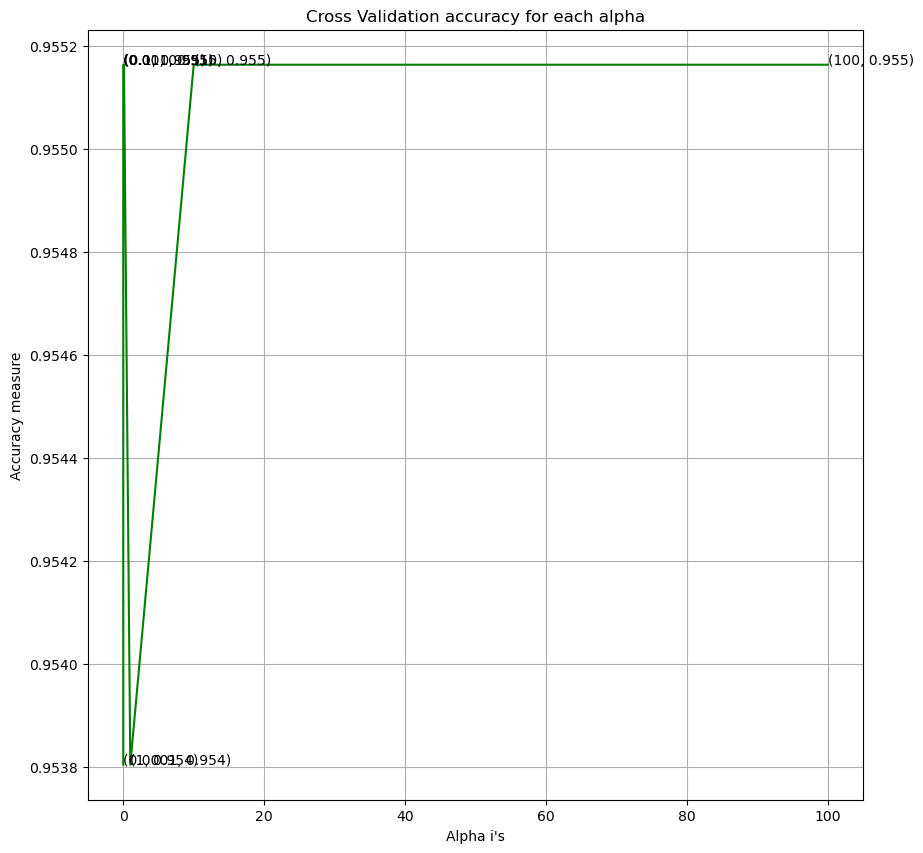

In [132]:
#Hyperparameter tuning
alpha = [10 ** x for x in range(-4, 3)]
cv_log_error_array=[] 
cv_acc_array = []
for i in tqdm(alpha):
    logisticR = LogisticRegression(penalty='l2',C=i,class_weight= 'balanced')
    logisticR.fit(x_train,y_train)
    cv_acc_array.append(accuracy_score(y_cv,logisticR.predict(x_cv)))
    
for i in range(len(cv_acc_array)):
    print('Accuracy for alpha '+str(alpha[i])+' is ',cv_acc_array[i])

best_alpha = np.argmax(cv_acc_array)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(alpha, cv_acc_array,c='g')
for i, txt in enumerate(np.round(cv_acc_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_acc_array[i]))
plt.grid()
plt.title("Cross Validation accuracy for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Accuracy measure")
plt.show()

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy on test data for final baseline model 0.9347826086956522
Precision on test data for final baseline model 0.9310344827586207
Recall on test data for final baseline model 0.9391304347826087
-------------------------------------------------- Confusion matrix --------------------------------------------------


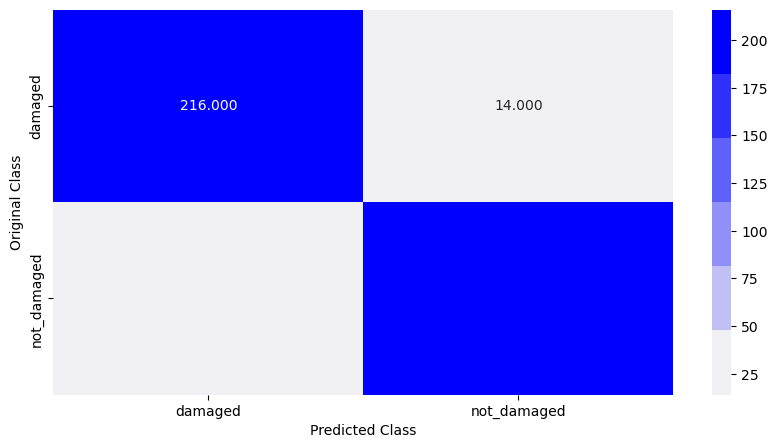

In [133]:
#Final model using best paramaters from hyperparameter tuning.
base_final=LogisticRegression(penalty='l2',C=alpha[best_alpha])
base_final.fit(x_train,y_train)

#saving the model
save_path = 'resnet/resnet_stage1_baseline.sav'
pickle.dump(base_final,open(save_path,'wb'))

#Predcitions and visualization of Confusion matrix
predict_y = base_final.predict(x_test)
print('Accuracy on test data for final baseline model',accuracy_score(y_test, predict_y))
precision,recall = compute_precision_recall(y_test,predict_y)
print('Precision on test data for final baseline model',precision)
print('Recall on test data for final baseline model',recall)
binary_confusion_matrix(y_test,predict_y,stage1_class_labels)

In [28]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage1_baseline','Accuracy':'0.935','Precision':'0.931','Recall':'0.939'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/2802077989.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage1_baseline','Accuracy':'0.935','Precision':'0.931','Recall':'0.939'},ignore_index= True)


In [30]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939


### Stage 2 Training

In [137]:
train_data_dir = 'data_augmentation_1/data_2/train'
test_data_dir = 'data_augmentation_1/data_2/test'

In [138]:
train_feat,test_feat,train_fd,test_fd = model_features(model_resnet,train_data_dir,test_data_dir)

Found 1970 images belonging to 3 classes.
Found 179 images belonging to 3 classes.
179/179 [==============================] - 23s 129ms/step


In [139]:
train_df = pd.DataFrame(train_feat)
x_test = pd.DataFrame(test_feat)

In [140]:
train_class = target_feat(train_fd)
y_test = target_feat(test_fd)

In [141]:
#Dividing the datasets into train and CV for hyperparameter tuning.
x_train,x_cv,y_train,y_cv = train_test_split(train_df,train_class,stratify=train_class,test_size=0.20)

 14%|██████▎                                     | 1/7 [01:57<11:42, 117.16s/it]/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 29%|████████████▌                               | 2/7 [03:44<09:18, 111.61s/it]/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/pre

Accuracy for alpha 0.0001 is  0.8375634517766497
Accuracy for alpha 0.001 is  0.8451776649746193
Accuracy for alpha 0.01 is  0.8451776649746193
Accuracy for alpha 0.1 is  0.850253807106599
Accuracy for alpha 1 is  0.850253807106599
Accuracy for alpha 10 is  0.850253807106599
Accuracy for alpha 100 is  0.8451776649746193


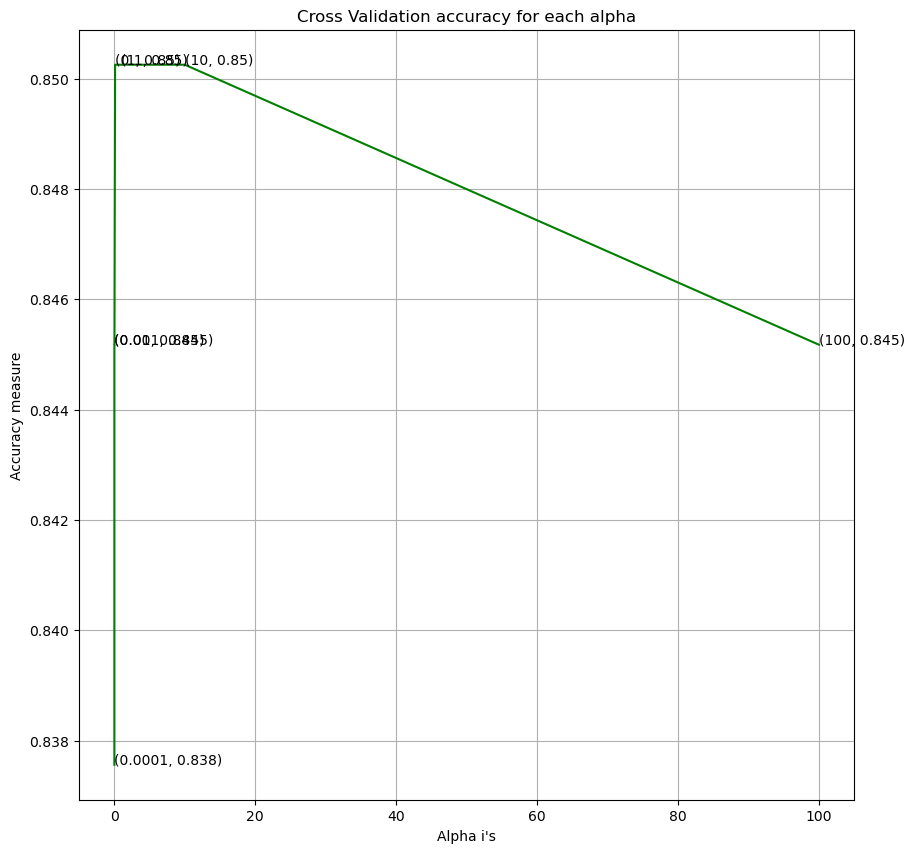

In [142]:
#Hyperparameter tuning
alpha = [10 ** x for x in range(-4, 3)]
cv_log_error_array=[] 
cv_acc_array = []
for i in tqdm(alpha):
    logisticR=LogisticRegression(penalty='l2',C=i,class_weight= 'balanced')
    logisticR.fit(x_train,y_train)
    cv_acc_array.append(accuracy_score(y_cv,logisticR.predict(x_cv)))
    
for i in range(len(cv_acc_array)):
    print('Accuracy for alpha '+str(alpha[i])+' is ',cv_acc_array[i])

best_alpha = np.argmax(cv_acc_array)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(alpha, cv_acc_array,c='g')
for i, txt in enumerate(np.round(cv_acc_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_acc_array[i]))
plt.grid()
plt.title("Cross Validation accuracy for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Accuracy measure")
plt.show()

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy on test data for final baseline model 0.7374301675977654
Average Precision is 0.747370831159933
Average Recall is 0.734395502020679
-------------------------------------------------- Confusion Matrix --------------------------------------------------


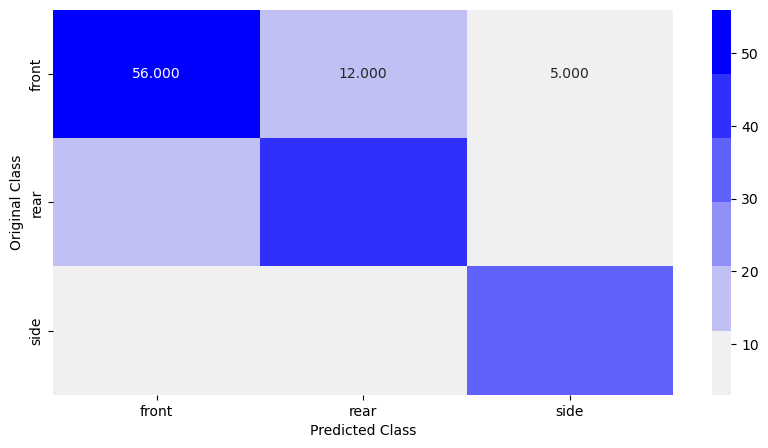

-------------------------------------------------- Precision Matrix --------------------------------------------------


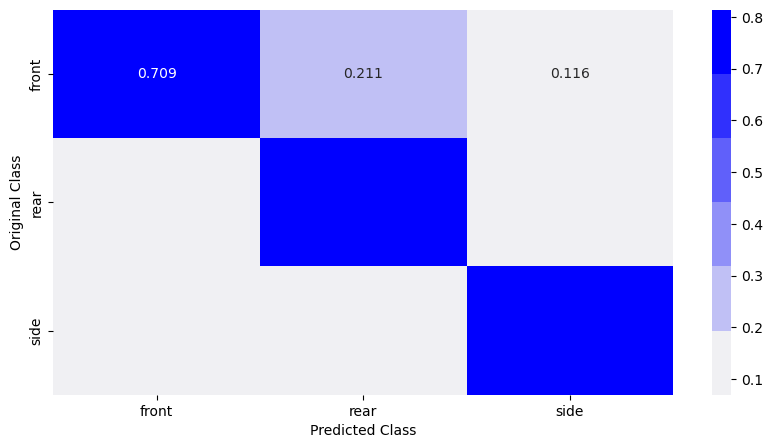

-------------------------------------------------- Recall Matrix --------------------------------------------------


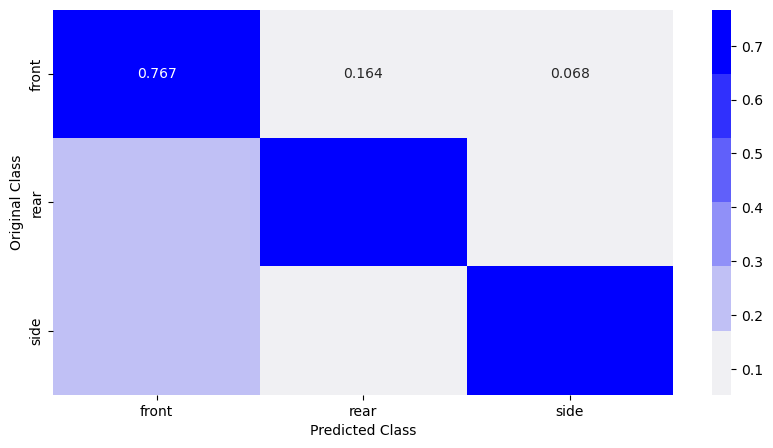

In [143]:
#Final model using best paramaters from hyperparameter tuning.
base_final=LogisticRegression(penalty='l2',C=alpha[best_alpha])
base_final.fit(x_train,y_train)

#saving the model 
save_path = 'resnet/resnet_stage2_baseline.sav'
pickle.dump(base_final,open(save_path,'wb'))

#Predcitions and visualization of Confusion matrix
predict_y = base_final.predict(x_test)
print ('Accuracy on test data for final baseline model',accuracy_score(y_test, predict_y))
multiclass_confusion_matrix(y_test,predict_y,stage2_class_labels)

In [32]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage2_baseline','Accuracy':'0.737','Precision':'0.747','Recall':'0.734'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/2230866777.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage2_baseline','Accuracy':'0.737','Precision':'0.747','Recall':'0.734'},ignore_index= True)


In [34]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734


### Stage 3 Training

In [147]:
train_data_dir = 'data_augmentation_1/data_3/train'
test_data_dir = 'data_augmentation_1/data_3/test'

In [148]:
train_feat,test_feat,train_fd,test_fd = model_features(model_resnet,train_data_dir,test_data_dir)

Found 1958 images belonging to 3 classes.
Found 171 images belonging to 3 classes.
171/171 [==============================] - 24s 138ms/step


In [149]:
train_df = pd.DataFrame(train_feat)
x_test = pd.DataFrame(test_feat)

In [150]:
train_class = target_feat(train_fd)
y_test = target_feat(test_fd)

In [151]:
#Dividing the datasets into train and CV for hyperparameter tuning.
x_train,x_cv,y_train,y_cv = train_test_split(train_df,train_class,stratify=train_class,test_size=0.20)

  0%|                                                     | 0/7 [00:00<?, ?it/s]/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
 14%|██████▎                                     | 1/7 [03:27<20:46, 207.81s/it]/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/pre

Accuracy for alpha 0.0001 is  0.8112244897959183
Accuracy for alpha 0.001 is  0.8086734693877551
Accuracy for alpha 0.01 is  0.8112244897959183
Accuracy for alpha 0.1 is  0.8163265306122449
Accuracy for alpha 1 is  0.8163265306122449
Accuracy for alpha 10 is  0.8163265306122449
Accuracy for alpha 100 is  0.8163265306122449


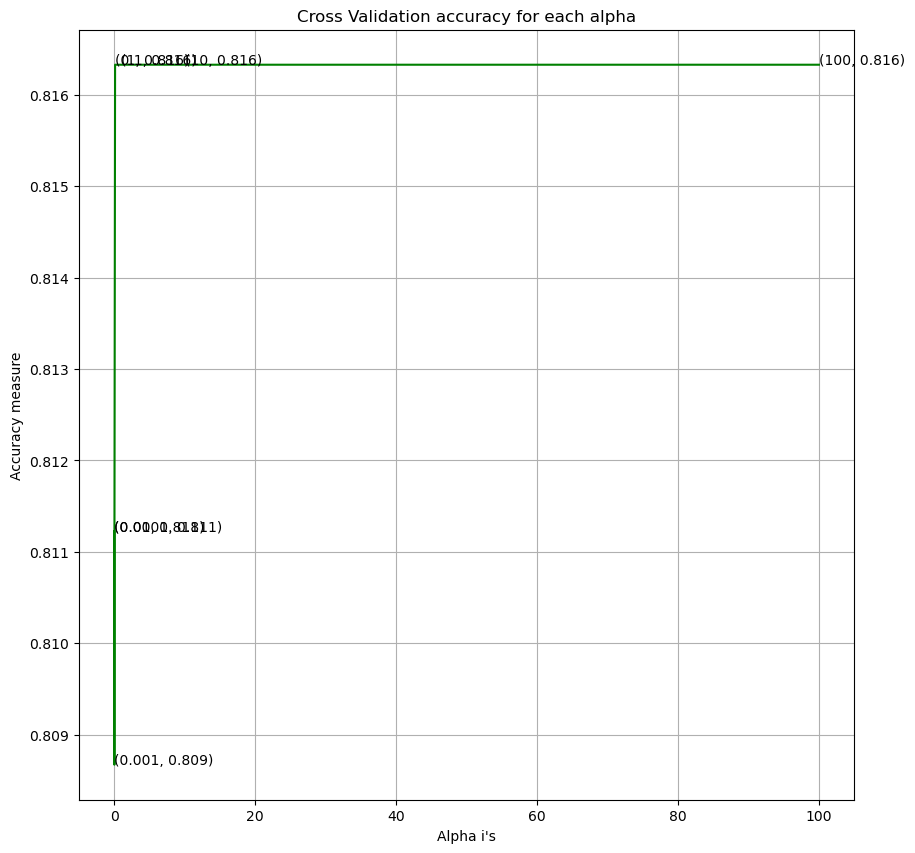

In [152]:
#Hyperparameter tuning
alpha = [10 ** x for x in range(-4, 3)]
cv_log_error_array=[] 
cv_acc_array = []
for i in tqdm(alpha):
    logisticR=LogisticRegression(penalty='l2',C=i,class_weight= 'balanced')
    logisticR.fit(x_train,y_train)
    cv_acc_array.append(accuracy_score(y_cv,logisticR.predict(x_cv)))
    
for i in range(len(cv_acc_array)):
    print('Accuracy for alpha '+str(alpha[i])+' is ',cv_acc_array[i])

best_alpha = np.argmax(cv_acc_array)
fig, ax = plt.subplots(figsize=(10,10))
ax.plot(alpha, cv_acc_array,c='g')
for i, txt in enumerate(np.round(cv_acc_array,3)):
    ax.annotate((alpha[i],np.round(txt,3)), (alpha[i],cv_acc_array[i]))
plt.grid()
plt.title("Cross Validation accuracy for each alpha")
plt.xlabel("Alpha i's")
plt.ylabel("Accuracy measure")
plt.show()

/Applications/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


Accuracy on test data for final baseline model 0.6783625730994152
Average Precision is 0.6825301891091365
Average Recall is 0.6635026737967915
-------------------------------------------------- Confusion Matrix --------------------------------------------------


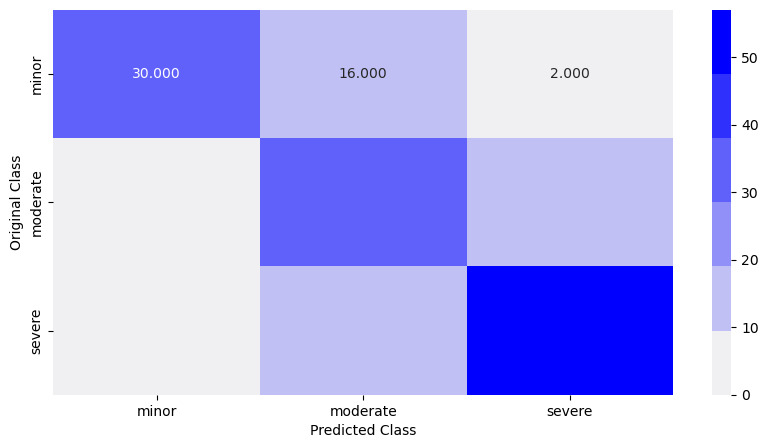

-------------------------------------------------- Precision Matrix --------------------------------------------------


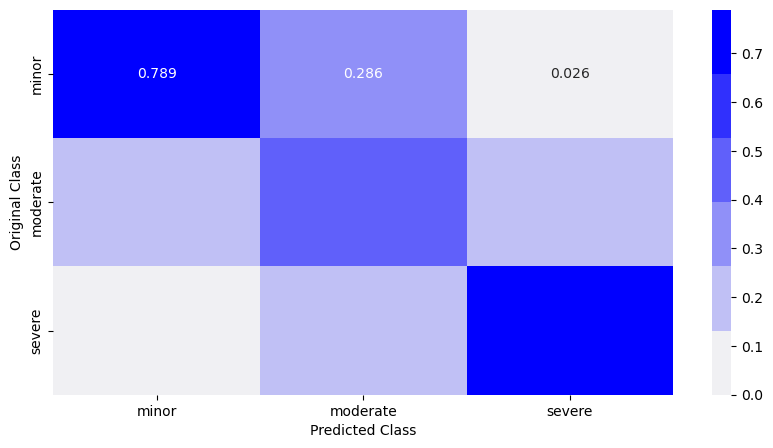

-------------------------------------------------- Recall Matrix --------------------------------------------------


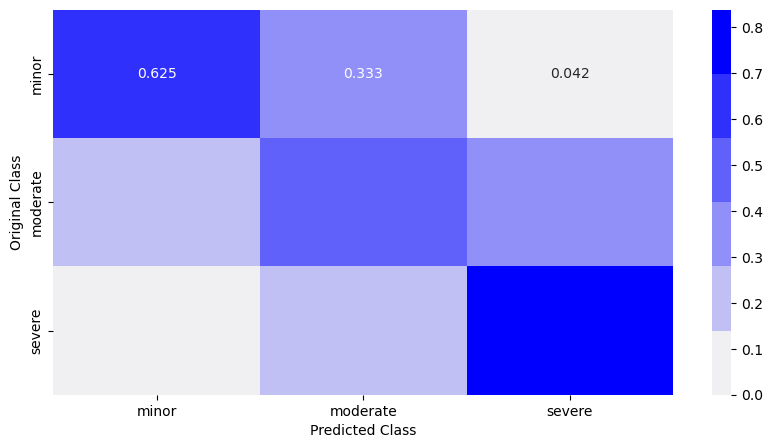

In [153]:
#Final model using best paramaters from hyperparameter tuning.
base_final=LogisticRegression(penalty='l2',C=alpha[best_alpha])
base_final.fit(x_train,y_train)

#saving the model
save_path = 'resnet/resnet_stage3_baseline.sav'
pickle.dump(base_final,open(save_path,'wb'))

#Predcitions and visualization of Confusion matrix
predict_y = base_final.predict(x_test)
print('Accuracy on test data for final baseline model',accuracy_score(y_test, predict_y))
multiclass_confusion_matrix(y_test,predict_y,stage3_class_labels)

In [36]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage3_baseline','Accuracy':'0.678','Precision':'0.683','Recall':'0.664'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/100860732.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage3_baseline','Accuracy':'0.678','Precision':'0.683','Recall':'0.664'},ignore_index= True)


In [38]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664


####

### CNN (Training of FC Layers)

In [40]:
def create_model(n_classes,output_activation):
    os.environ['PYTHONHASHSEED'] = '0'
    tf.keras.backend.clear_session()

    ## Set the random seed values to regenerate the model.
    np.random.seed(0)
    rn.seed(0)

    #Input layer
    input_layer = Input(shape=(256,256,3),name='Input_Layer')

    #Adding pretrained model
    resnet = applications.ResNet50(include_top=False,weights='imagenet',input_tensor = input_layer)
    resnet = non_trainable(resnet)

    #Flatten
    flatten = Flatten(data_format='channels_last',name='Flatten')(resnet.output)

    #FC layer
    FC1 = Dense(units=512,activation='relu',name='FC1')(flatten)

    #FC layer
    FC2 = Dense(units=256,activation='relu',name='FC2')(FC1)

    #Dropout layer
    droput1 = Dropout(0.5)(FC2)

    #output layer
    Out = Dense(units=n_classes,activation=output_activation,name='Output')(droput1)

    #Creating the Model
    model = Model(inputs=input_layer,outputs=Out)

    return model

### Stage 1

In [194]:
model = create_model(1,'sigmoid')

In [196]:
#Compiling the model
model.compile(loss='binary_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

/Applications/anaconda3/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [198]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Layer (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['Input_Layer[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

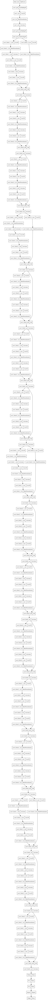

In [200]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [202]:
#Model saving based on validation accuracy score
filepath="resnet/resnet_stage1_fc-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

In [204]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [206]:
train_data_dir = 'data_augmentation_1/data_1/train'
test_data_dir = 'data_augmentation_1/data_1/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")

n_validation_steps = 460/batch_size
n_steps_epoch = 3680/batch_size

Found 3680 images belonging to 2 classes.
Found 460 images belonging to 2 classes.


In [208]:
model.fit(train_generator,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=10,callbacks=[checkpoint])

Epoch 1/10
460/460 [==============================] - ETA: 0s - loss: 0.4610 - accuracy: 0.8079
Epoch 1: val_accuracy improved from -inf to 0.89565, saving model to resnet/resnet_stage1_fc-0.896.hdf5
460/460 [==============================] - 571s 1s/step - loss: 0.4610 - accuracy: 0.8079 - val_loss: 0.2529 - val_accuracy: 0.8957
Epoch 2/10
460/460 [==============================] - ETA: 0s - loss: 0.1895 - accuracy: 0.9285
Epoch 2: val_accuracy improved from 0.89565 to 0.92826, saving model to resnet/resnet_stage1_fc-0.928.hdf5
460/460 [==============================] - 580s 1s/step - loss: 0.1895 - accuracy: 0.9285 - val_loss: 0.1980 - val_accuracy: 0.9283
Epoch 3/10
460/460 [==============================] - ETA: 0s - loss: 0.1148 - accuracy: 0.9576
Epoch 3: val_accuracy did not improve from 0.92826
460/460 [==============================] - 703s 2s/step - loss: 0.1148 - accuracy: 0.9576 - val_loss: 0.2019 - val_accuracy: 0.9283
Epoch 4/10
460/460 [==============================] - 

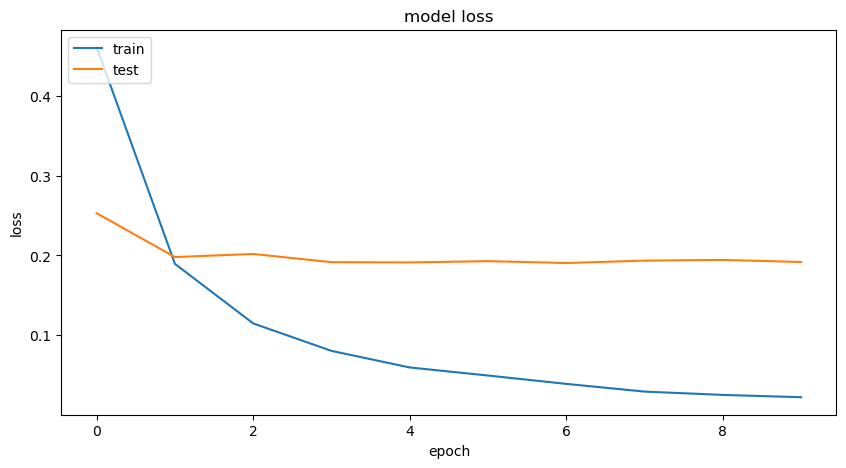

The loss for final model is  0.19356252253055573


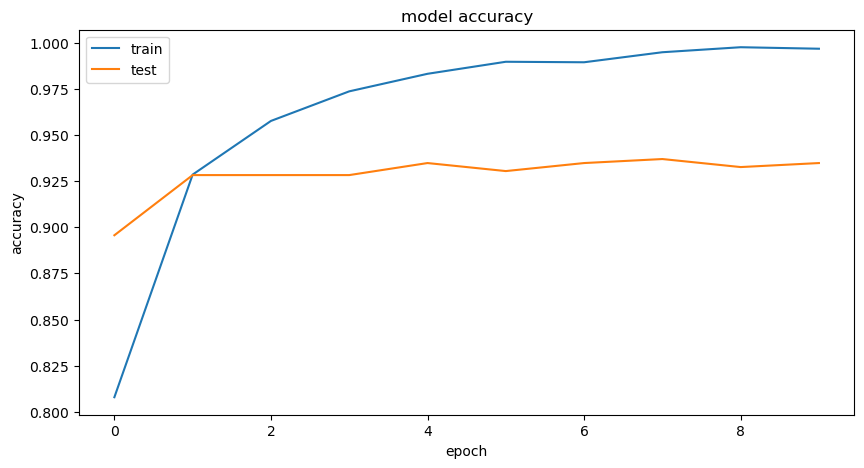

The accuracy for final model is  0.936956524848938


In [210]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [212]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1, class_mode = "binary",shuffle = False)

Found 460 images belonging to 2 classes.


In [216]:
best_model = load_model('resnet/resnet_stage1_fc-0.937.hdf5')

In [218]:
y_pred = best_model.predict(x_test)

460/460 [==============================] - 56s 121ms/step


In [220]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  if i <= .5:
    y_predicted.append('damaged')
  elif i > .5:
    y_predicted.append('not_damaged')

Accuracy on test data for final baseline model 0.9369565217391305
Precision on test data for final baseline model 0.9205020920502092
Recall on test data for final baseline model 0.9565217391304348
-------------------------------------------------- Confusion matrix --------------------------------------------------


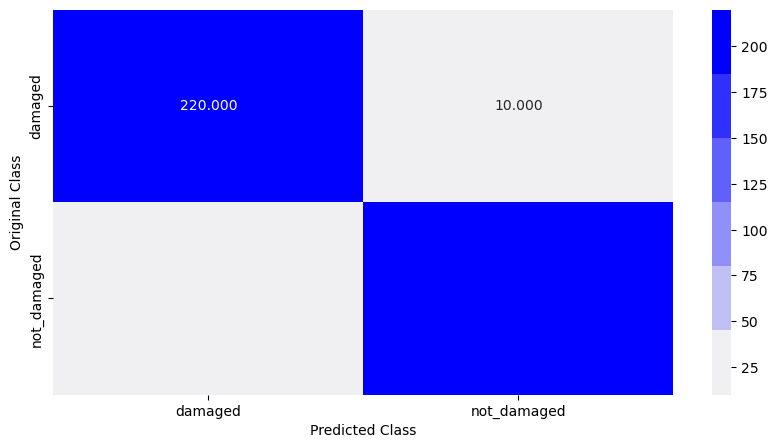

In [224]:
precision,recall = compute_precision_recall(y_true,y_predicted)
print('Accuracy on test data for final baseline model',accuracy_score(y_true, y_predicted))
print('Precision on test data for final baseline model',precision)
print('Recall on test data for final baseline model',recall)
binary_confusion_matrix(y_true,y_predicted,stage1_class_labels)

In [42]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage1 FC','Accuracy':'0.937','Precision':'0.921','Recall':'0.957'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/4025849225.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage1 FC','Accuracy':'0.937','Precision':'0.921','Recall':'0.957'},ignore_index= True)


In [44]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957


## Stage 2

In [234]:
model = create_model(3,'softmax')

In [236]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

/Applications/anaconda3/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [238]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Layer (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['Input_Layer[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

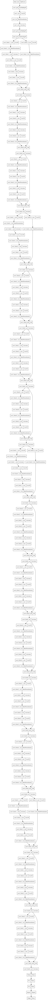

In [240]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [242]:
#Model saving based on validation accuracy score
filepath="resnet/resnet_stage2_fc-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [244]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [246]:
train_data_dir = 'data_augmentation_1/data_2/train'
test_data_dir = 'data_augmentation_1/data_2/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 179/batch_size
n_steps_epoch = 1970/batch_size

Found 1970 images belonging to 3 classes.
Found 179 images belonging to 3 classes.


In [248]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=10,callbacks=[checkpoint])

Epoch 1/10
247/246 [==============================] - ETA: 0s - loss: 1.4086 - accuracy: 0.4964
Epoch 1: val_accuracy improved from -inf to 0.59777, saving model to resnet/resnet_stage2_fc-0.598.hdf5
246/246 [==============================] - 238s 956ms/step - loss: 1.4086 - accuracy: 0.4964 - val_loss: 0.9108 - val_accuracy: 0.5978
Epoch 2/10
247/246 [==============================] - ETA: 0s - loss: 0.5506 - accuracy: 0.7792
Epoch 2: val_accuracy improved from 0.59777 to 0.67039, saving model to resnet/resnet_stage2_fc-0.670.hdf5
246/246 [==============================] - 248s 1s/step - loss: 0.5506 - accuracy: 0.7792 - val_loss: 0.7485 - val_accuracy: 0.6704
Epoch 3/10
247/246 [==============================] - ETA: 0s - loss: 0.3403 - accuracy: 0.8716
Epoch 3: val_accuracy did not improve from 0.67039
246/246 [==============================] - 230s 935ms/step - loss: 0.3403 - accuracy: 0.8716 - val_loss: 0.7341 - val_accuracy: 0.6592
Epoch 4/10
247/246 [============================

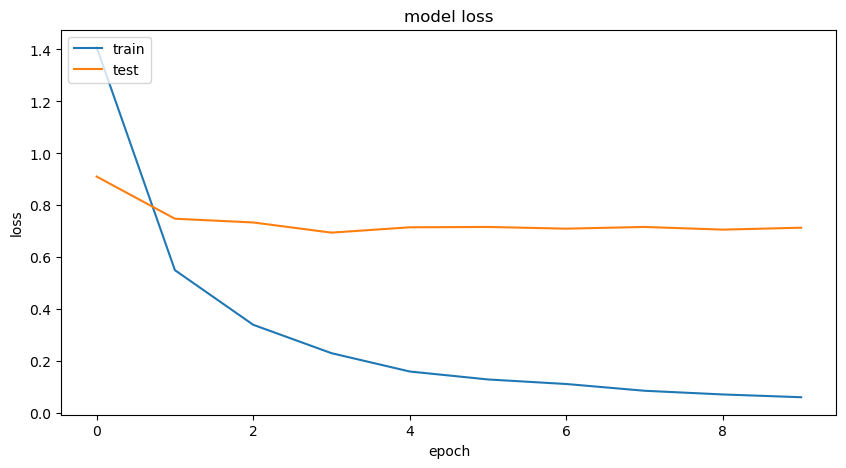

The loss for final model is  0.713956892490387


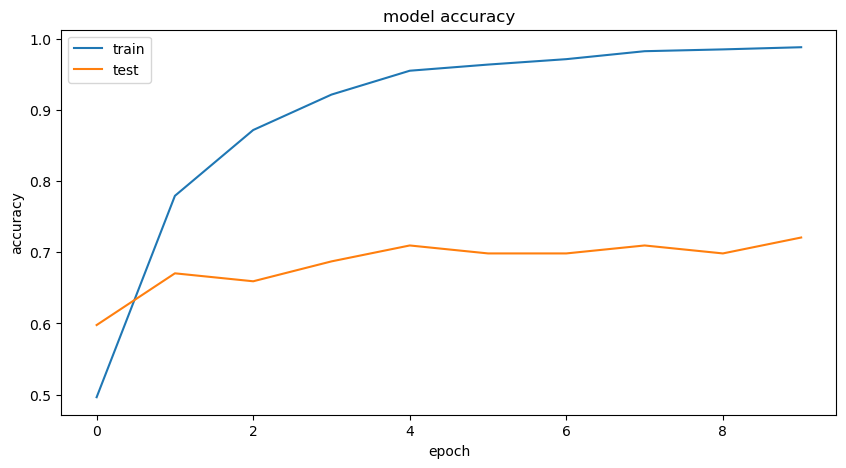

The accuracy for final model is  0.7206704020500183


In [251]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [253]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 179 images belonging to 3 classes.


In [255]:
best_model = load_model('resnet/resnet_stage2_fc-0.721.hdf5')

In [256]:
y_pred = best_model.predict(x_test)

179/179 [==============================] - 22s 118ms/step


In [258]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('front')
  elif n== 1:
    y_predicted.append('rear')
  elif n == 2:
    y_predicted.append('side')

Accuracy on test data for final baseline model 0.7206703910614525
Average Precision is 0.7300811638161036
Average Recall is 0.7147758883115519
-------------------------------------------------- Confusion Matrix --------------------------------------------------


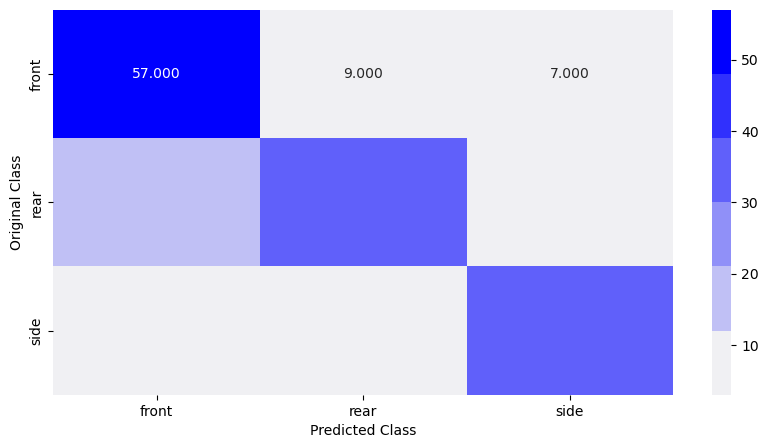

-------------------------------------------------- Precision Matrix --------------------------------------------------


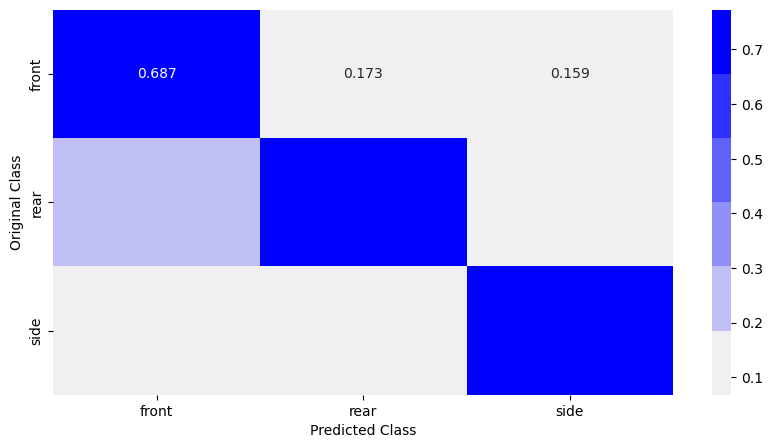

-------------------------------------------------- Recall Matrix --------------------------------------------------


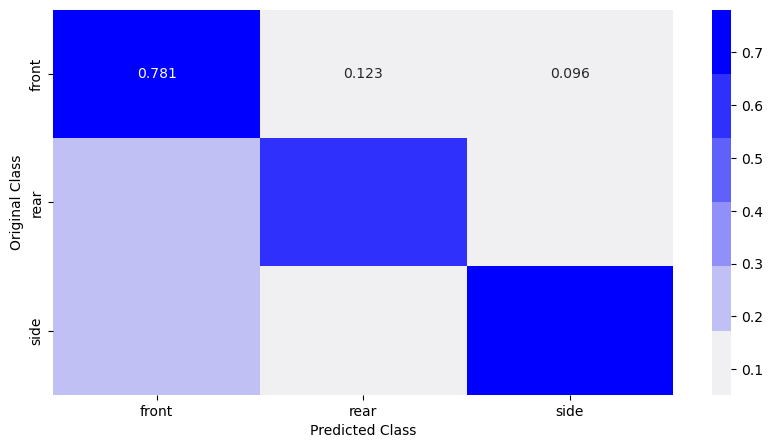

In [261]:
print ('Accuracy on test data for final baseline model',accuracy_score(y_true, y_predicted))
multiclass_confusion_matrix(y_true,y_predicted,stage2_class_labels)

In [46]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage2 FC','Accuracy':'0.721','Precision':'0.730','Recall':'0.715'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/426036105.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage2 FC','Accuracy':'0.721','Precision':'0.730','Recall':'0.715'},ignore_index= True)


In [48]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957
4,Resnet_stage2 FC,0.721,0.730,0.715


### Stage 3

In [313]:
model = create_model(3,'softmax')

In [315]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

/Applications/anaconda3/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [317]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Layer (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['Input_Layer[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

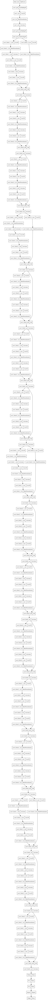

In [319]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [321]:
#Model saving based on validation accuracy score
filepath="resnet/resnet_stage3_fc-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [323]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [325]:
train_data_dir = 'data_augmentation_1/data_3/train'
test_data_dir = 'data_augmentation_1/data_3/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 171/batch_size
n_steps_epoch = 1958/batch_size

Found 1958 images belonging to 3 classes.
Found 171 images belonging to 3 classes.


In [329]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=10,callbacks=[checkpoint])

Epoch 1/10
245/244 [==============================] - ETA: 0s - loss: 0.5644 - accuracy: 0.7712
Epoch 1: val_accuracy did not improve from 0.57895
244/244 [==============================] - 306s 1s/step - loss: 0.5644 - accuracy: 0.7712 - val_loss: 0.9750 - val_accuracy: 0.5673
Epoch 2/10
245/244 [==============================] - ETA: 0s - loss: 0.3466 - accuracy: 0.8596
Epoch 2: val_accuracy improved from 0.57895 to 0.62573, saving model to resnet/resnet_stage3_fc-0.626.hdf5
244/244 [==============================] - 352s 1s/step - loss: 0.3466 - accuracy: 0.8596 - val_loss: 0.9200 - val_accuracy: 0.6257
Epoch 3/10
245/244 [==============================] - ETA: 0s - loss: 0.2326 - accuracy: 0.9280
Epoch 3: val_accuracy did not improve from 0.62573
244/244 [==============================] - 267s 1s/step - loss: 0.2326 - accuracy: 0.9280 - val_loss: 0.9444 - val_accuracy: 0.6082
Epoch 4/10
245/244 [==============================] - ETA: 0s - loss: 0.1802 - accuracy: 0.9382
Epoch 4: va

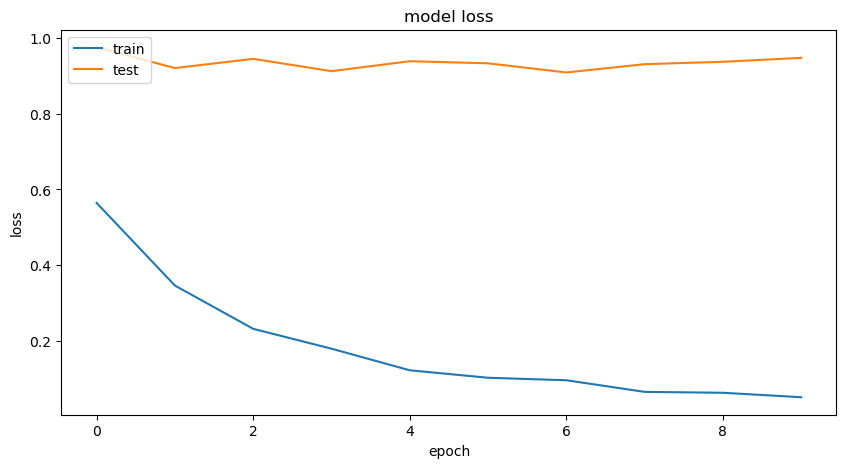

The loss for final model is  0.9469466805458069


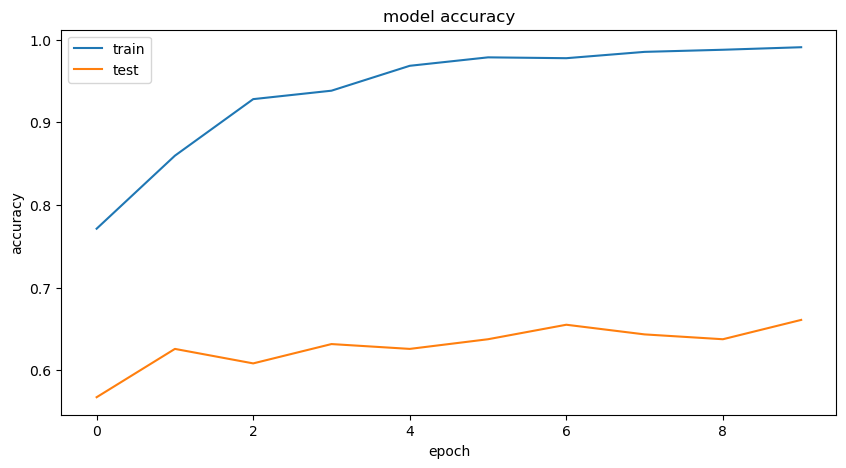

The accuracy for final model is  0.6608186960220337


In [331]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [333]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 171 images belonging to 3 classes.


In [335]:
best_model = load_model('resnet/resnet_stage3_fc-0.661.hdf5')

In [337]:
y_pred = best_model.predict(x_test)

171/171 [==============================] - 21s 119ms/step


In [342]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
    n = np.argmax(i)
    if n == 0:
        y_predicted.append('minor')
    elif n== 1:
        y_predicted.append('moderate')
    elif n == 2:
        y_predicted.append('severe')

Accuracy on test data for final baseline model 0.6608187134502924
Average Precision is 0.6632767816978343
Average Recall is 0.6479129530600117
-------------------------------------------------- Confusion Matrix --------------------------------------------------


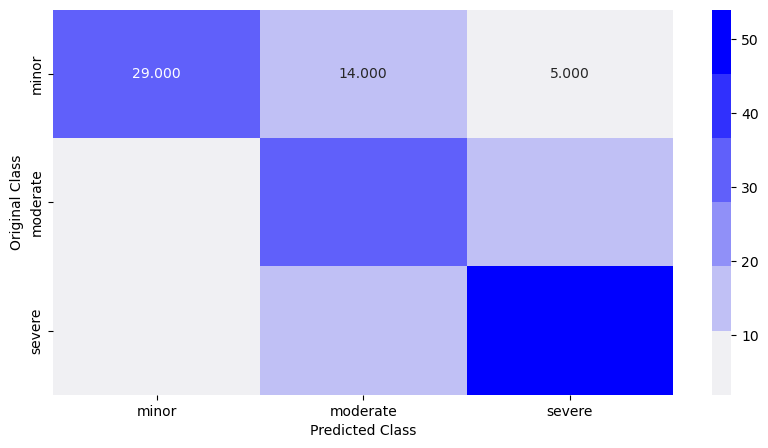

-------------------------------------------------- Precision Matrix --------------------------------------------------


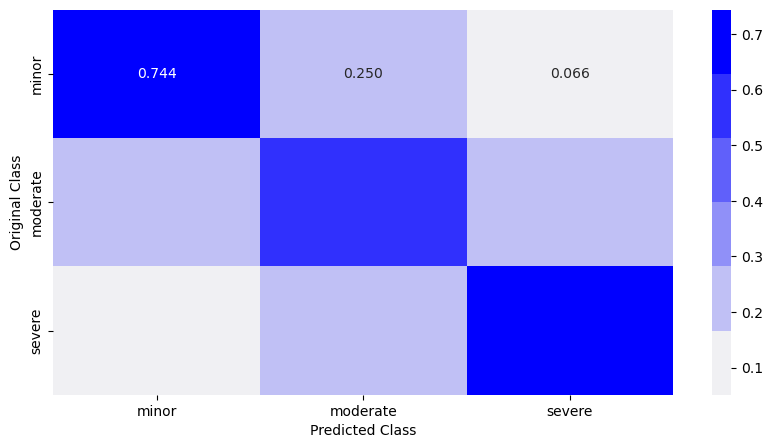

-------------------------------------------------- Recall Matrix --------------------------------------------------


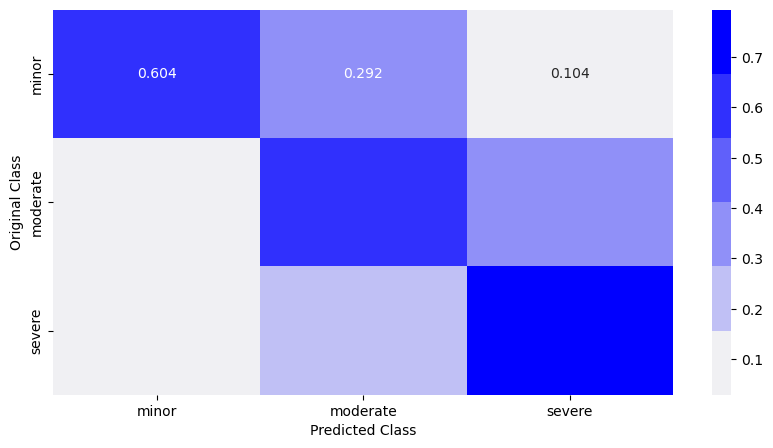

In [344]:
print ('Accuracy on test data for final baseline model',accuracy_score(y_true, y_predicted))
multiclass_confusion_matrix(y_true,y_predicted,stage3_class_labels)

In [50]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage3 FC','Accuracy':'0.661','Precision':'0.643','Recall':'0.648'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/1037101413.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage3 FC','Accuracy':'0.661','Precision':'0.643','Recall':'0.648'},ignore_index= True)


In [52]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957
4,Resnet_stage2 FC,0.721,0.730,0.715
5,Resnet_stage3 FC,0.661,0.643,0.648


####

### CNN (Training All Layers)

In [54]:
def create_model(n_classes,output_activation):
    os.environ['PYTHONHASHSEED'] = '0'
    tf.keras.backend.clear_session()

    ## Set the random seed values to regenerate the model.
    np.random.seed(0)
    rn.seed(0)

    #Input layer
    input_layer = Input(shape=(256,256,3),name='Input_Layer')

    #Adding pretrained model
    resnet = applications.ResNet50(include_top=False,weights='imagenet',input_tensor = input_layer)

    #Flatten
    flatten = Flatten(data_format='channels_last',name='Flatten')(resnet.output)

    #FC layer
    FC1 = Dense(units=512,activation='relu',name='FC1')(flatten)

    #FC layer
    FC2 = Dense(units=256,activation='relu',name='FC2')(FC1)

    #Dropout layer
    droput1 = Dropout(0.5)(FC2)

    #output layer
    Out = Dense(units=n_classes,activation=output_activation,name='Output')(droput1)

    #Creating the Model
    model = Model(inputs=input_layer,outputs=Out)

    return model

### Stage 1

In [57]:
model = create_model(1,'sigmoid')

2024-07-08 18:51:29.913091: I tensorflow/core/platform/cpu_feature_guard.cc:193] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  SSE4.1 SSE4.2
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.


In [59]:
#Compiling the model
model.compile(loss = 'binary_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

/Applications/anaconda3/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [61]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Layer (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['Input_Layer[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

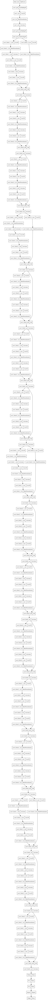

In [63]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [65]:
#Model saving based on validation accuracy score
filepath="resnet/resnet_stage1_all-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',  verbose=1, save_best_only=True, mode='auto')

In [67]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [69]:
train_data_dir = 'data_augmentation_1/data_1/train'
test_data_dir = 'data_augmentation_1/data_1/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size, class_mode = "binary")

n_validation_steps = 460/batch_size
n_steps_epoch = 3680/batch_size

Found 3680 images belonging to 2 classes.
Found 460 images belonging to 2 classes.


In [75]:
model.fit(train_generator,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=3,callbacks=[checkpoint])

Epoch 1/3
460/460 [==============================] - ETA: 0s - loss: 0.0780 - accuracy: 0.9726
Epoch 1: val_accuracy did not improve from 0.94565
460/460 [==============================] - 1856s 4s/step - loss: 0.0780 - accuracy: 0.9726 - val_loss: 0.1744 - val_accuracy: 0.9457
Epoch 2/3
460/460 [==============================] - ETA: 0s - loss: 0.0669 - accuracy: 0.9777
Epoch 2: val_accuracy did not improve from 0.94565
460/460 [==============================] - 2176s 5s/step - loss: 0.0669 - accuracy: 0.9777 - val_loss: 0.1759 - val_accuracy: 0.9413
Epoch 3/3
460/460 [==============================] - ETA: 0s - loss: 0.0574 - accuracy: 0.9815
Epoch 3: val_accuracy improved from 0.94565 to 0.94783, saving model to resnet/resnet_stage1_all-0.948.hdf5
460/460 [==============================] - 1871s 4s/step - loss: 0.0574 - accuracy: 0.9815 - val_loss: 0.1777 - val_accuracy: 0.9478


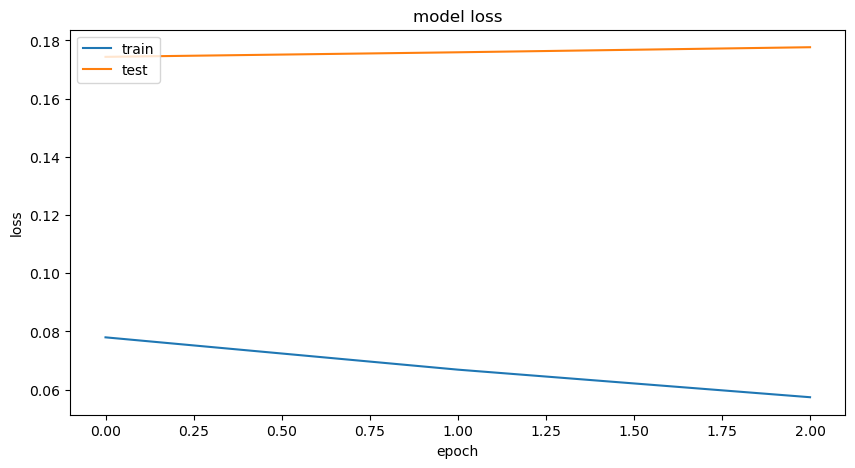

The loss for final model is  0.17767323553562164


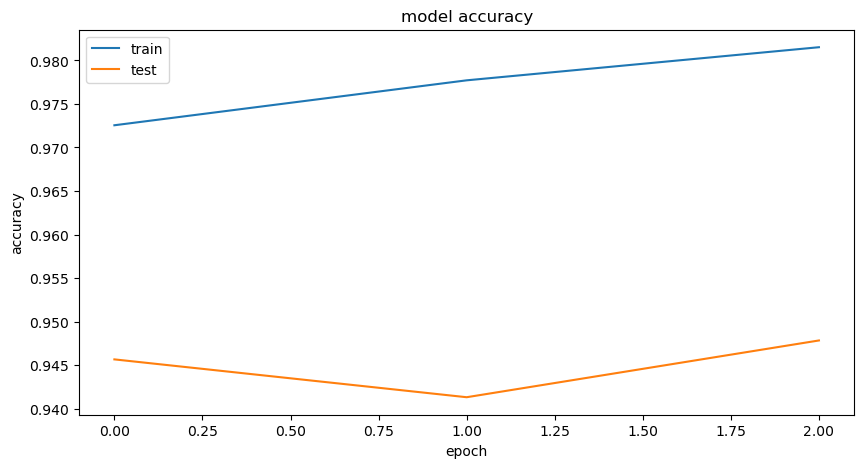

The accuracy for final model is  0.947826087474823


In [77]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [79]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1, class_mode = "binary",shuffle = False)

Found 460 images belonging to 2 classes.


In [83]:
best_model = load_model('resnet/resnet_stage1_all-0.948.hdf5')

In [85]:
y_pred = best_model.predict(x_test)

460/460 [==============================] - 56s 119ms/step


In [87]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  if i <= .5:
    y_predicted.append('damaged')
  elif i > .5:
    y_predicted.append('not_damaged')

Accuracy on test data for final baseline model 0.9478260869565217
Precision on test data for final baseline model 0.9291666666666667
Recall on test data for final baseline model 0.9695652173913043
-------------------------------------------------- Confusion matrix --------------------------------------------------


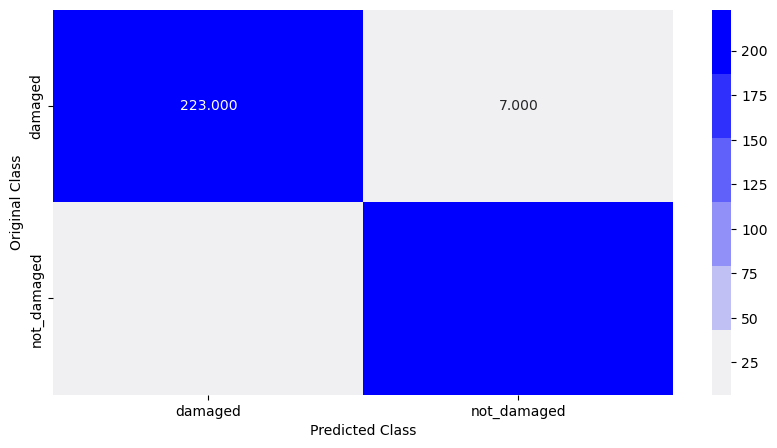

In [89]:
precision,recall = compute_precision_recall(y_true,y_predicted)
print('Accuracy on test data for final baseline model',accuracy_score(y_true, y_predicted))
print ('Precision on test data for final baseline model',precision)
print ('Recall on test data for final baseline model',recall)
binary_confusion_matrix(y_true,y_predicted,stage1_class_labels)

In [91]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage1 all','Accuracy':'0.948','Precision':'0.930','Recall':'0.970'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/2204583413.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage1 all','Accuracy':'0.948','Precision':'0.930','Recall':'0.970'},ignore_index= True)


In [93]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957
4,Resnet_stage2 FC,0.721,0.730,0.715
5,Resnet_stage3 FC,0.661,0.643,0.648
6,Resnet_stage1 all,0.948,0.930,0.970


### Stage 2

In [96]:
model = create_model(3,'softmax')

In [98]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

/Applications/anaconda3/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [100]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Layer (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['Input_Layer[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

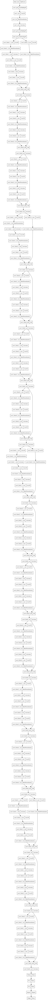

In [102]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [104]:
#Model saving based on validation accuracy score
filepath="resnet/resnet_stage2_all-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [106]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [108]:
train_data_dir = 'data_augmentation_1/data_2/train'
test_data_dir = 'data_augmentation_1/data_2/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 179/batch_size
n_steps_epoch = 1970/batch_size

Found 1970 images belonging to 3 classes.
Found 179 images belonging to 3 classes.


In [110]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=10,callbacks=[checkpoint])

Epoch 1/10
247/246 [==============================] - ETA: -2s - loss: 1.5105 - accuracy: 0.4320
Epoch 1: val_accuracy improved from -inf to 0.52514, saving model to resnet/resnet_stage2_all-0.525.hdf5
246/246 [==============================] - 999s 4s/step - loss: 1.5105 - accuracy: 0.4320 - val_loss: 0.9809 - val_accuracy: 0.5251
Epoch 2/10
247/246 [==============================] - ETA: -3s - loss: 0.7333 - accuracy: 0.6944
Epoch 2: val_accuracy improved from 0.52514 to 0.64804, saving model to resnet/resnet_stage2_all-0.648.hdf5
246/246 [==============================] - 1246s 5s/step - loss: 0.7333 - accuracy: 0.6944 - val_loss: 0.8260 - val_accuracy: 0.6480
Epoch 3/10
247/246 [==============================] - ETA: -3s - loss: 0.4962 - accuracy: 0.8056
Epoch 3: val_accuracy improved from 0.64804 to 0.66480, saving model to resnet/resnet_stage2_all-0.665.hdf5
246/246 [==============================] - 1213s 5s/step - loss: 0.4962 - accuracy: 0.8056 - val_loss: 0.7536 - val_accurac

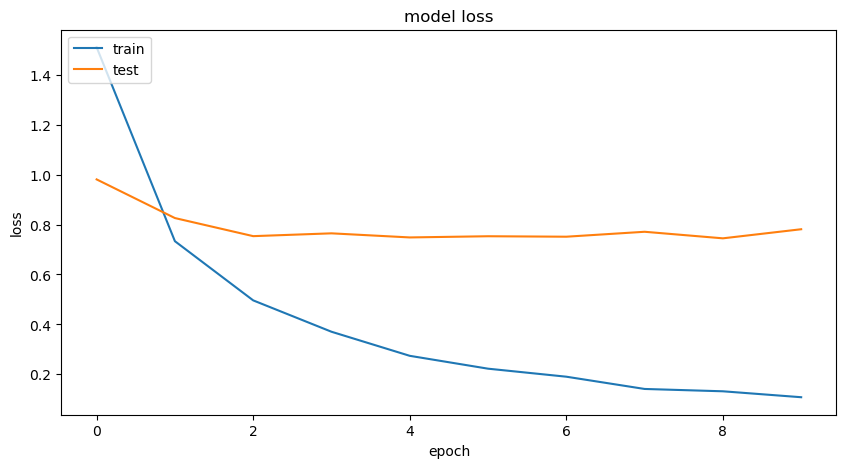

The loss for final model is  0.7531821727752686


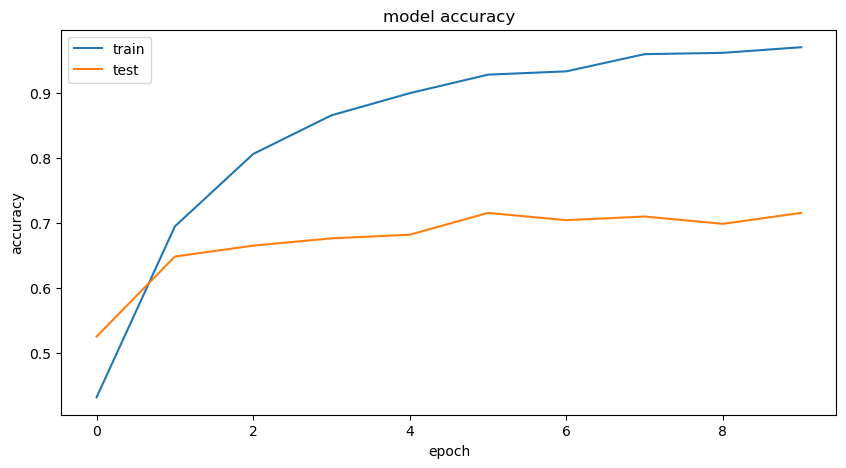

The accuracy for final model is  0.7150837779045105


In [115]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [117]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 179 images belonging to 3 classes.


In [119]:
best_model = load_model('resnet/resnet_stage2_all-0.715.hdf5')

In [121]:
y_pred = best_model.predict(x_test)

179/179 [==============================] - 23s 124ms/step


In [123]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('front')
  elif n== 1:
    y_predicted.append('rear')
  elif n == 2:
    y_predicted.append('side')

Accuracy on test data for final baseline model 0.7150837988826816
Average Precision is 0.7115233190050213
Average Recall is 0.716097858604944
-------------------------------------------------- Confusion Matrix --------------------------------------------------


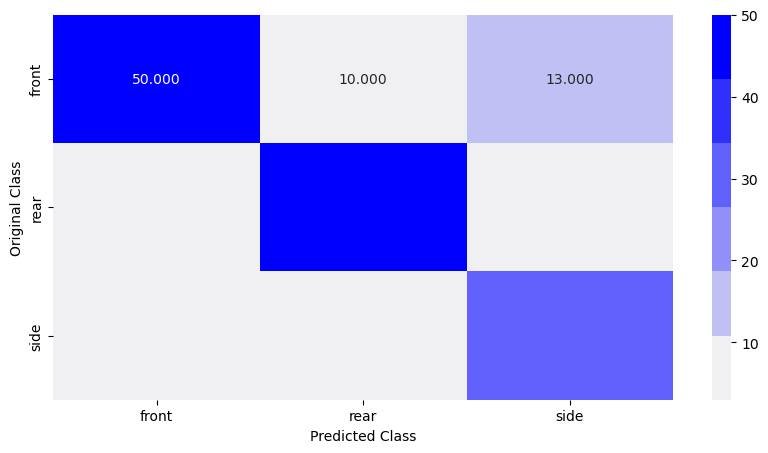

-------------------------------------------------- Precision Matrix --------------------------------------------------


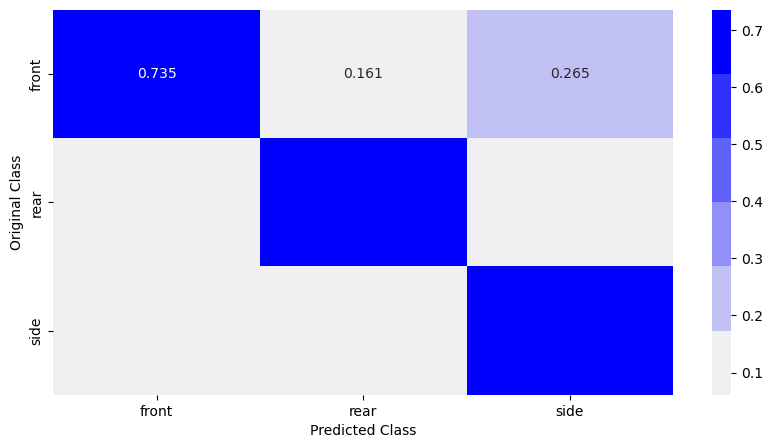

-------------------------------------------------- Recall Matrix --------------------------------------------------


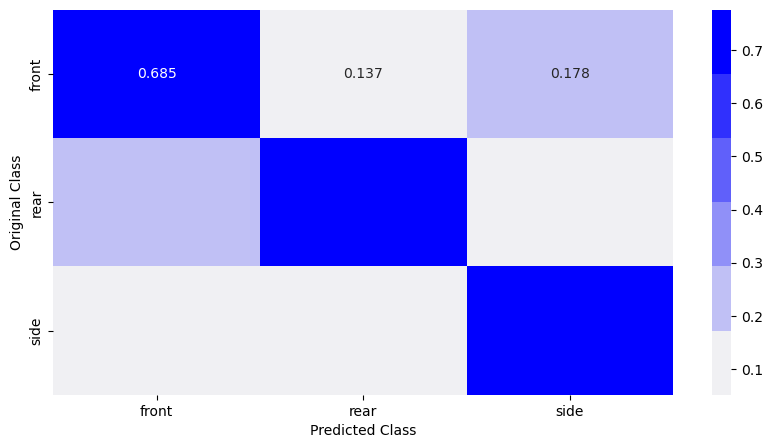

In [125]:
print('Accuracy on test data for final baseline model',accuracy_score(y_true, y_predicted))
multiclass_confusion_matrix(y_true,y_predicted,stage2_class_labels)

In [127]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage2 all','Accuracy':'0.715','Precision':'0.712','Recall':'0.716'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/2556822579.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage2 all','Accuracy':'0.715','Precision':'0.712','Recall':'0.716'},ignore_index= True)


In [129]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957
4,Resnet_stage2 FC,0.721,0.730,0.715
5,Resnet_stage3 FC,0.661,0.643,0.648
6,Resnet_stage1 all,0.948,0.930,0.970
7,Resnet_stage2 all,0.715,0.712,0.716


### Stage 3

In [133]:
model = create_model(3,'softmax')

In [135]:
#Compiling the model
model.compile(loss = 'categorical_crossentropy', optimizer = optimizers.SGD(lr=0.00001, momentum=0.9), metrics=["accuracy"])

/Applications/anaconda3/lib/python3.9/site-packages/keras/optimizers/optimizer_v2/gradient_descent.py:111: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


In [137]:
model.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input_Layer (InputLayer)       [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 conv1_pad (ZeroPadding2D)      (None, 262, 262, 3)  0           ['Input_Layer[0][0]']            
                                                                                                  
 conv1_conv (Conv2D)            (None, 128, 128, 64  9472        ['conv1_pad[0][0]']              
                                )                                                                 
                                                                                              

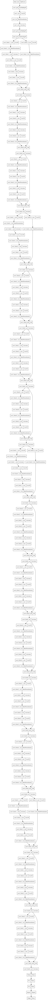

In [139]:
tf.keras.utils.plot_model(
    model, to_file='model.png', show_shapes=False, show_layer_names=True,rankdir='TB', expand_nested=False, dpi=96)

In [141]:
#Model saving based on validation accuracy score
filepath="resnet/resnet_stage3_all-{val_accuracy:.3f}.hdf5"
checkpoint = ModelCheckpoint(filepath=filepath, monitor='val_accuracy',verbose=1, save_best_only=True, mode='auto')

In [ ]:
traindatagen = ImageDataGenerator()
testdatagen = ImageDataGenerator()

In [143]:
train_data_dir = 'data_augmentation_1/data_3/train'
test_data_dir = 'data_augmentation_1/data_3/test'

train_generator = traindatagen.flow_from_directory(train_data_dir,target_size = (256,256),batch_size = batch_size)
test_generator = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = batch_size)

n_validation_steps = 171/batch_size
n_steps_epoch = 1958/batch_size

Found 1958 images belonging to 3 classes.
Found 171 images belonging to 3 classes.


In [145]:
model.fit(train_generator ,validation_data = test_generator,validation_steps = n_validation_steps,steps_per_epoch=n_steps_epoch,epochs=10,callbacks=[checkpoint])

Epoch 1/10
245/244 [==============================] - ETA: 0s - loss: 1.4576 - accuracy: 0.4489
Epoch 1: val_accuracy improved from -inf to 0.53216, saving model to resnet/resnet_stage3_all-0.532.hdf5
244/244 [==============================] - 961s 4s/step - loss: 1.4576 - accuracy: 0.4489 - val_loss: 1.0481 - val_accuracy: 0.5322
Epoch 2/10
245/244 [==============================] - ETA: -1s - loss: 0.7097 - accuracy: 0.6920
Epoch 2: val_accuracy improved from 0.53216 to 0.59064, saving model to resnet/resnet_stage3_all-0.591.hdf5
244/244 [==============================] - 1059s 4s/step - loss: 0.7097 - accuracy: 0.6920 - val_loss: 0.9540 - val_accuracy: 0.5906
Epoch 3/10
245/244 [==============================] - ETA: -12s - loss: 0.4827 - accuracy: 0.7962
Epoch 3: val_accuracy did not improve from 0.59064
244/244 [==============================] - 12503s 51s/step - loss: 0.4827 - accuracy: 0.7962 - val_loss: 0.9010 - val_accuracy: 0.5906
Epoch 4/10
245/244 [=========================

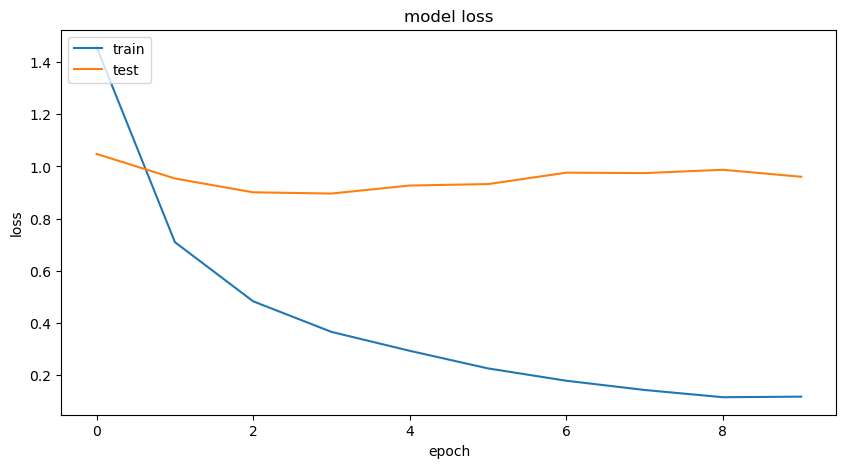

The loss for final model is  0.9606688022613525


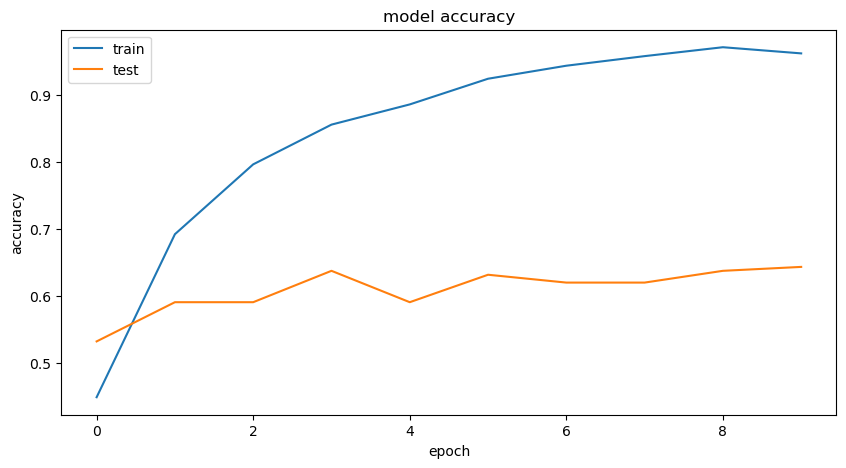

The accuracy for final model is  0.6432748436927795


In [147]:
for i in ['loss','accuracy']:
  plot_metrics(model,i)

In [149]:
x_test = testdatagen.flow_from_directory(test_data_dir,target_size = (256,256),batch_size = 1,shuffle = False)

Found 171 images belonging to 3 classes.


In [153]:
best_model = load_model('resnet/resnet_stage3_all-0.643.hdf5')

In [155]:
y_pred = best_model.predict(x_test)

171/171 [==============================] - 28s 159ms/step


In [157]:
y_true = target_feat(x_test)
y_predicted = []
for i in y_pred:
  n = np.argmax(i)
  if n == 0:
    y_predicted.append('minor')
  elif n== 1:
    y_predicted.append('moderate')
  elif n == 2:
    y_predicted.append('severe')

Accuracy on test data for final baseline model 0.6432748538011696
Average Precision is 0.6415343915343915
Average Recall is 0.6372920380273323
-------------------------------------------------- Confusion Matrix --------------------------------------------------


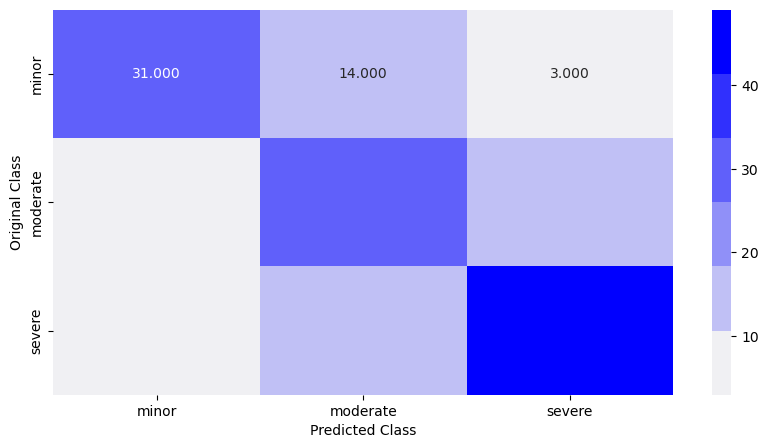

-------------------------------------------------- Precision Matrix --------------------------------------------------


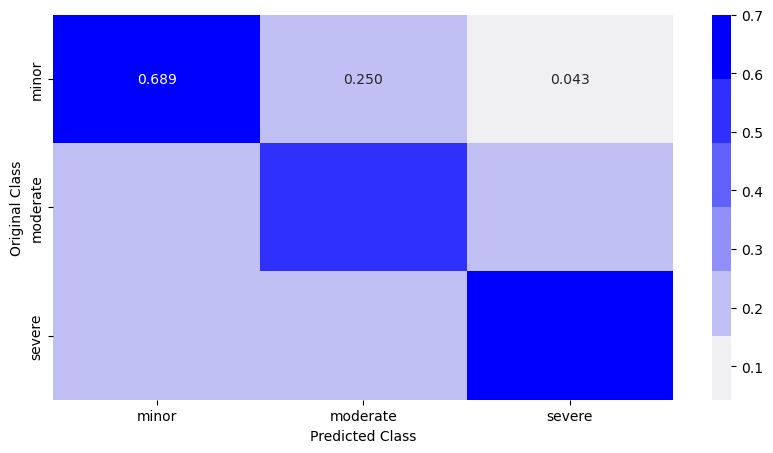

-------------------------------------------------- Recall Matrix --------------------------------------------------


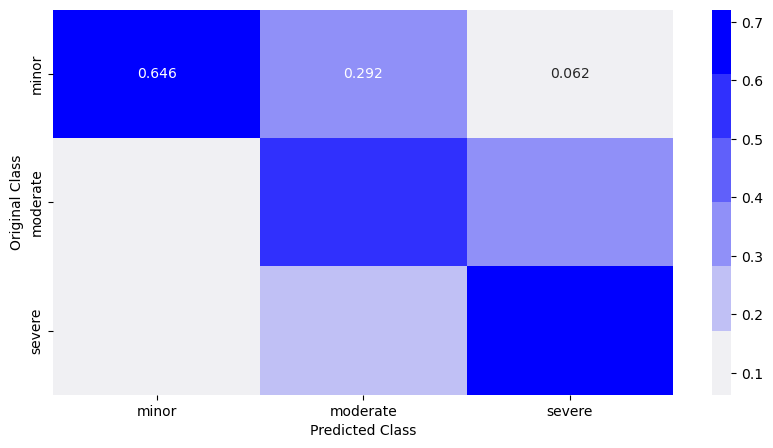

In [159]:
print('Accuracy on test data for final baseline model',accuracy_score(y_true, y_predicted))
multiclass_confusion_matrix(y_true,y_predicted,stage3_class_labels)

In [169]:
resnet_scores = resnet_scores.append({'Model':'Resnet_stage3 all','Accuracy':'0.643','Precision':'0.642','Recall':'0.637'},ignore_index= True)

/var/folders/b1/nb_549714h9c28550y1_1n280000gq/T/ipykernel_14369/4150641769.py:1: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  resnet_scores = resnet_scores.append({'Model':'Resnet_stage3 all','Accuracy':'0.643','Precision':'0.642','Recall':'0.637'},ignore_index= True)


In [173]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957
4,Resnet_stage2 FC,0.721,0.730,0.715
5,Resnet_stage3 FC,0.661,0.643,0.648
6,Resnet_stage1 all,0.948,0.930,0.970
7,Resnet_stage2 all,0.715,0.712,0.716
8,Resnet_stage3 all,0.643,0.642,0.637


In [175]:
resnet_scores.to_csv('resnet_scores.csv',index=False)

### * * * * *

###

###

###

### 3) Image Processing for Detection using ResNet50:
#### - Importing of best models for each of Stages 1,2,3
#### - Report Generation for Processed Image

In [195]:
resnet_scores

,Model,Accuracy,Precision,Recall
0,Resnet_stage1_baseline,0.935,0.931,0.939
1,Resnet_stage2_baseline,0.737,0.747,0.734
2,Resnet_stage3_baseline,0.678,0.683,0.664
3,Resnet_stage1 FC,0.937,0.921,0.957
4,Resnet_stage2 FC,0.721,0.730,0.715
5,Resnet_stage3 FC,0.661,0.643,0.648
6,Resnet_stage1 all,0.948,0.930,0.970
7,Resnet_stage2 all,0.715,0.712,0.716
8,Resnet_stage3 all,0.643,0.642,0.637


In [197]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
import os
import re
import random
from tqdm import tqdm
import tensorflow as tf
import cv2
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.preprocessing.image import load_img,img_to_array
from tensorflow.keras.models import Sequential, Model, load_model

In [212]:
stage_1_best_model = load_model('resnet/resnet_stage1_all-0.948.hdf5')
stage_2_best_model = load_model('resnet/resnet_stage2_fc-0.721.hdf5')
stage_3_best_model = load_model('resnet/resnet_stage3_fc-0.661.hdf5')
# Stages 2 & 3 are baseline, but not able to load it (.sav instead of .hdf5 extension)

In [224]:
!/usr/local/cuda/bin/nvcc --version
# Check if GPU is selected as hardware accelerator
import tensorflow as tf
device_name = tf.test.gpu_device_name()
if not '/device:GPU:0' in device_name:
    print('\nERROR: GPU is not selected as hardware accelerator!')
else:
    print(device_name)

zsh:1: no such file or directory: /usr/local/cuda/bin/nvcc

ERROR: GPU is not selected as hardware accelerator!


In [226]:
!git clone https://github.com/AlexeyAB/darknet
%cd darknet
!ls
!sed -i 's/OPENCV=0/OPENCV=1/g' Makefile
!sed -i 's/GPU=0/GPU=1/g' Makefile
!make

Cloning into 'darknet'...
remote: Enumerating objects: 15851, done.
remote: Total 15851 (delta 0), reused 0 (delta 0), pack-reused 15851
Receiving objects: 100% (15851/15851), 14.37 MiB | 654.00 KiB/s, done.
Resolving deltas: 100% (10683/10683), done.
/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/darknet
3rdparty               cfg                    json_mjpeg_streams.sh
CMakeLists.txt         cmake                  net_cam_v3.sh
DarknetConfig.cmake.in darknet.py             net_cam_v4.sh
Dockerfile.cpu         darknet_images.py      package.xml
Dockerfile.gpu         darknet_video.py       scripts
LICENSE                data                   src
Makefile               docker-compose.yml     vcpkg.json
README.md              image_yolov3.sh        vcpkg.json.opencv23
build                  image_yolov4.sh        video_yolov3.sh
build.ps1              include                video_yolov4.sh
sed: 1: "Makefile": invalid command code M
sed: 1: "Makefile": invalid comm

### Report Generation for Input image

In [228]:
# Function which predicts whether Car is damaged or not and localizing the damage along with it's severity
def report(img_path):
    report_pred = []
    #Creating Train and test text files:
    test_file = open('/content/test.txt','w')
    test_file.write('/content/'+img_path+'\n')
    test_file.close()
    
    img = load_img('/content/' + img_path,target_size = (256,256))
    #Converting into array
    img_arr = img_to_array(img)
    img_arr = img_arr.reshape((1,) + img_arr.shape)
    
    #Check if Damaged or not
    s1_pred = stage_1_best_model.predict(img_arr)
    if s1_pred <=0.5:
        report_pred.append('Damaged')
    else:
        report_pred.append('Not Damaged')
        print('Are you sure the vehicle is damaged? If not please upload another image.')
        return
        
    #Check for Damage Location
    s2_pred = stage_2_best_model.predict(img_arr)
    n = np.argmax(s2_pred)
    if n == 0:
        report_pred.append('Front')
    elif n ==1:
        report_pred.append('Rear')
    else:
        report_pred.append('Side')
    
    #Check for Damage Severity
    s3_pred = stage_3_best_model.predict(img_arr)
    c = np.argmax(s3_pred)
    if c == 0:
        report_pred.append('Minor')
    elif c ==1:
        report_pred.append('Moderate')
    elif c==2:
        report_pred.append('Severe')

    image_path = '/content/'+img_path
        
    #Using YOLO to detect the damage type
    temp = !./darknet detector test /content/YOLO/custom.data /content/YOLO/yolov3_custom.cfg /content/models_weights/yolov3_custom_4000.weights -dont_show </content/test.txt> result.txt

    #Report
    print('The car is ' + report_pred[0] + ' on the ' + report_pred[1] + ' suffering ' + report_pred[2] + ' damages.')

    %matplotlib inline
    image = cv2.imread('predictions.jpg')
    fig = plt.gcf()
    fig.set_size_inches(18, 10)
    plt.axis("off")
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.show()

In [ ]:
# Data without Augmentation

for i in range(0,5):
    
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/train/damaged'))
    '''
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/train/not_damaged'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/test/damaged'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/test/not_damaged'))
    ///
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/train/front'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/train/rear'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/train/side'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/test/front'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/test/rear'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/test/side'))
    ///
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/train/minor'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/train/moderate'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/train/severe'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/test/minor'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/test/moderate'))
    sample_file = random.choice(os.listdir('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/test/severe'))
    '''

    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/train/damaged'+'/'+sample_file)
    '''
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/train/not_damaged'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/test/damaged'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_1/test/not_damaged'+'/'+sample_file)
    ///
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/train/front'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/train/rear'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/train/side'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/test/front'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/test/rear'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_2/test/side'+'/'+sample_file)
    ///
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/train/minor'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/train/moderate'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/train/severe'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/test/minor'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/test/moderate'+'/'+sample_file)
    sample_img = image.load_img('/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/data/data_3/test/severe'+'/'+sample_file)
    '''

    report(sample_img)
    #sample_img_array = image.img_to_array(sample_img)
    #sample_img_array = sample_img_array.reshape((1,) + sample_img_array.shape)
    #report(sample_img_array)

In [232]:
# Data Augmentation 1

In [234]:
# Data Augmentation 2

In [238]:
os.getcwd()

'/Users/sibikarthik/VEHICLE_DAMAGE_DETECTION_COMMON_SENSE_INTERNSHIP/darknet'